<a href="https://colab.research.google.com/github/appasami/Deep-learning/blob/main/Appasami_photo_GUI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, FloatSlider, RadioButtons, IntSlider, Button, HBox, VBox
from PIL import Image, ImageEnhance

# Load an image using PIL
img_path = '/content/drive/MyDrive/Appasami.jpg'  # replace with your image path
img = Image.open(img_path)

# Convert image to a NumPy array
img_array = np.array(img)

# Function to apply image transformations
def edit_image(r_factor, g_factor, b_factor, brightness, contrast, rotation, flip, color_mode):
    img_mod = img_array.copy()

    # Convert back to PIL image for further editing
    img_mod_pil = Image.fromarray(img_mod)

    # Apply brightness and contrast adjustments
    enhancer_bright = ImageEnhance.Brightness(img_mod_pil)
    img_mod_pil = enhancer_bright.enhance(brightness)

    enhancer_contrast = ImageEnhance.Contrast(img_mod_pil)
    img_mod_pil = enhancer_contrast.enhance(contrast)

    # Apply color transformations based on the radio button input
    img_mod = np.array(img_mod_pil)
    if color_mode == 'Red':
        img_mod[..., 0] = img_mod[..., 0] * r_factor
    elif color_mode == 'Green':
        img_mod[..., 1] = img_mod[..., 1] * g_factor
    elif color_mode == 'Blue':
        img_mod[..., 2] = img_mod[..., 2] * b_factor
    else:
        img_mod[..., 0] = img_mod[..., 0] * r_factor
        img_mod[..., 1] = img_mod[..., 1] * g_factor
        img_mod[..., 2] = img_mod[..., 2] * b_factor

    img_mod = np.clip(img_mod, 0, 255).astype(np.uint8)

    # Convert the result back to PIL image
    img_mod_pil = Image.fromarray(img_mod)

    # Apply rotation
    img_mod_pil = img_mod_pil.rotate(rotation, expand=True)

    # Apply flipping if requested
    if flip == 'Horizontal':
        img_mod_pil = img_mod_pil.transpose(Image.FLIP_LEFT_RIGHT)
    elif flip == 'Vertical':
        img_mod_pil = img_mod_pil.transpose(Image.FLIP_TOP_BOTTOM)

    # Display the modified image
    plt.imshow(img_mod_pil)
    plt.axis('off')
    plt.show()

# Creating the interactive sliders and buttons for various options
r_slider = FloatSlider(value=1, min=0, max=2, step=0.1, description='Red')
g_slider = FloatSlider(value=1, min=0, max=2, step=0.1, description='Green')
b_slider = FloatSlider(value=1, min=0, max=2, step=0.1, description='Blue')
brightness_slider = FloatSlider(value=1, min=0, max=2, step=0.1, description='Brightness')
contrast_slider = FloatSlider(value=1, min=0, max=2, step=0.1, description='Contrast')
rotation_slider = IntSlider(value=0, min=0, max=360, step=15, description='Rotation')

color_mode_radio = RadioButtons(
    options=['All', 'Red', 'Green', 'Blue'],
    value='All',
    description='Color Mode'
)

flip_radio = RadioButtons(
    options=['None', 'Horizontal', 'Vertical'],
    value='None',
    description='Flip'
)

# Display the interactive widgets using HBox and VBox layout
ui = VBox([
    HBox([r_slider, g_slider, b_slider]),
    HBox([brightness_slider, contrast_slider]),
    HBox([rotation_slider, flip_radio]),
    color_mode_radio
])

# Display the interactive GUI and call the function
interact(edit_image, r_factor=r_slider, g_factor=g_slider, b_factor=b_slider,
         brightness=brightness_slider, contrast=contrast_slider,
         rotation=rotation_slider, flip=flip_radio, color_mode=color_mode_radio)


interactive(children=(FloatSlider(value=1.0, description='Red', max=2.0), FloatSlider(value=1.0, description='…

<function __main__.edit_image(r_factor, g_factor, b_factor, brightness, contrast, rotation, flip, color_mode)>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, FloatSlider, RadioButtons
from PIL import Image

# Load an image using PIL
img_path = '/content/drive/MyDrive/Appasami.jpg'  # replace with your image path
img = Image.open(img_path)

# Convert image to a NumPy array
img_array = np.array(img)

# Function to change the image colors based on slider and radio button input
def change_image_colors(r_factor, g_factor, b_factor, color_mode):
    img_mod = img_array.copy()

    # Apply different scaling based on the color mode
    if color_mode == 'Red':
        img_mod[..., 0] = img_mod[..., 0] * r_factor
    elif color_mode == 'Green':
        img_mod[..., 1] = img_mod[..., 1] * g_factor
    elif color_mode == 'Blue':
        img_mod[..., 2] = img_mod[..., 2] * b_factor
    else:
        # Apply the scaling for all RGB channels
        img_mod[..., 0] = img_mod[..., 0] * r_factor
        img_mod[..., 1] = img_mod[..., 1] * g_factor
        img_mod[..., 2] = img_mod[..., 2] * b_factor

    # Clip values to be between 0 and 255 (valid color range)
    img_mod = np.clip(img_mod, 0, 255).astype(np.uint8)

    # Display the modified image
    plt.imshow(img_mod)
    plt.axis('off')
    plt.show()

# Interactive sliders and radio button for changing image colors
r_slider = FloatSlider(value=1, min=0, max=2, step=0.1, description='Red')
g_slider = FloatSlider(value=1, min=0, max=2, step=0.1, description='Green')
b_slider = FloatSlider(value=1, min=0, max=2, step=0.1, description='Blue')

color_mode_radio = RadioButtons(
    options=['All', 'Red', 'Green', 'Blue'],
    value='All',
    description='Color Mode'
)

# Display the interactive widgets
interact(change_image_colors, r_factor=r_slider, g_factor=g_slider, b_factor=b_slider, color_mode=color_mode_radio)


interactive(children=(FloatSlider(value=1.0, description='Red', max=2.0), FloatSlider(value=1.0, description='…

<function __main__.change_image_colors(r_factor, g_factor, b_factor, color_mode)>

IndexError: list index out of range

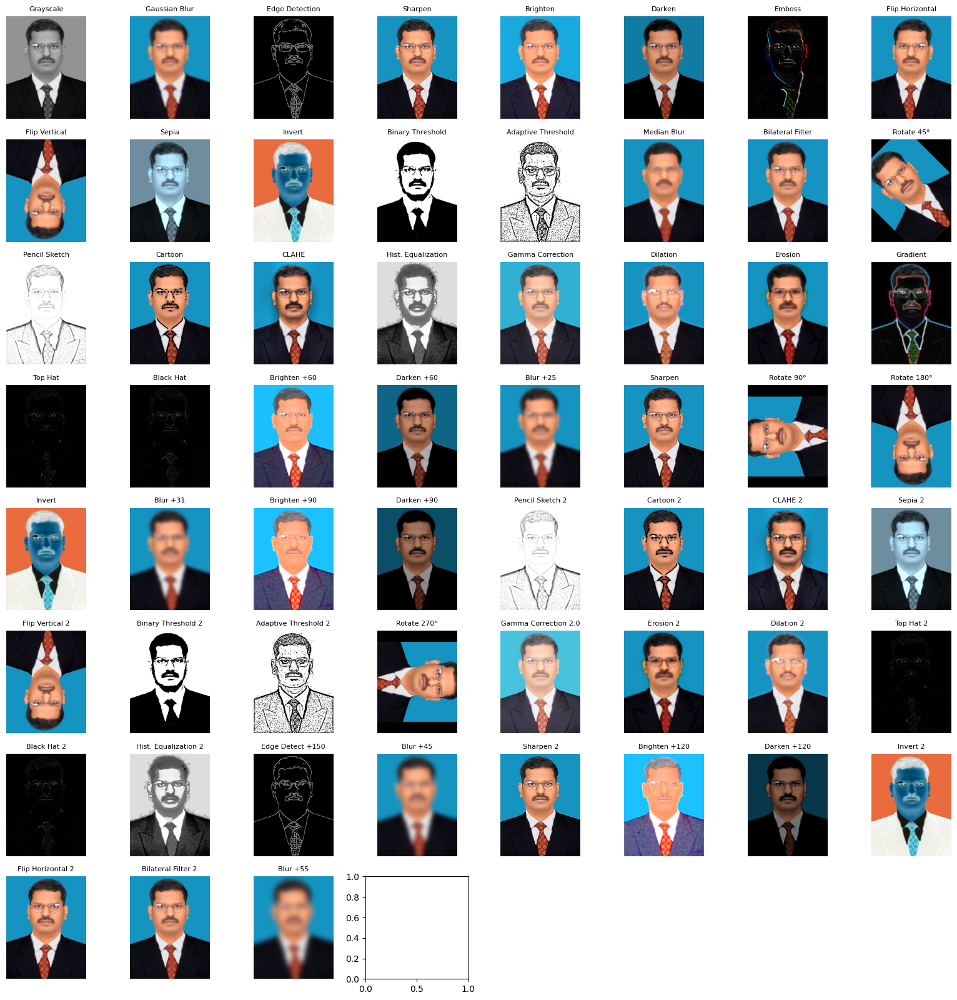

In [ ]:
import cv2
from matplotlib import pyplot as plt
import numpy as np

# Define the image path
img_path = '/content/drive/MyDrive/Appasami.jpg'

# Load the image
image = cv2.imread(img_path)

# Convert the image from BGR to RGB for displaying purposes
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Define different types of image processing functions
def grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def blur(img, kernel_size=(15, 15)):
    return cv2.GaussianBlur(img, kernel_size, 0)

def edge_detection(img, low_threshold=100, high_threshold=200):
    return cv2.Canny(img, low_threshold, high_threshold)

def sharpen(img):
    kernel = np.array([[0, -1, 0], [-1, 5,-1], [0, -1, 0]])
    return cv2.filter2D(img, -1, kernel)

def brighten(img, value=30):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    v = cv2.add(v, value)
    v = np.clip(v, 0, 255)
    final_hsv = cv2.merge((h, s, v))
    return cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)

def darken(img, value=30):
    return brighten(img, -value)

def emboss(img):
    kernel = np.array([[0,-1,-1],[1,0,-1],[1,1,0]])
    return cv2.filter2D(img, -1, kernel)

def flip_horizontal(img):
    return cv2.flip(img, 1)

def flip_vertical(img):
    return cv2.flip(img, 0)

def sepia(img):
    kernel = np.array([[0.272, 0.534, 0.131],
                       [0.349, 0.686, 0.168],
                       [0.393, 0.769, 0.189]])
    return cv2.transform(img, kernel)

def invert(img):
    return cv2.bitwise_not(img)

def binary_threshold(img):
    gray = grayscale(img)
    _, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
    return thresh

def adaptive_threshold(img):
    gray = grayscale(img)
    return cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

def median_blur(img):
    return cv2.medianBlur(img, 15)

def bilateral_filter(img):
    return cv2.bilateralFilter(img, 9, 75, 75)

def rotate(img, angle=45):
    (h, w) = img.shape[:2]
    center = (w // 2, h // 2)
    matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    return cv2.warpAffine(img, matrix, (w, h))

def pencil_sketch(img):
    gray_img = grayscale(img)
    inverted_img = invert(gray_img)
    blur_img = cv2.GaussianBlur(inverted_img, (21, 21), 0)
    sketch = cv2.divide(gray_img, 255 - blur_img, scale=256)
    return sketch

def cartoon(img):
    gray = grayscale(img)
    gray = cv2.medianBlur(gray, 5)
    edges = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 9, 9)
    color = cv2.bilateralFilter(img, 9, 300, 300)
    cartoon = cv2.bitwise_and(color, color, mask=edges)
    return cartoon

def clahe(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    v_clahe = clahe.apply(v)
    final_hsv = cv2.merge((h, s, v_clahe))
    return cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)

def histogram_equalization(img):
    gray = grayscale(img)
    return cv2.equalizeHist(gray)

def gamma_correction(img, gamma=1.5):
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(img, table)

def dilation(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.dilate(img, kernel, iterations=1)

def erosion(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.erode(img, kernel, iterations=1)

def gradient(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)

def top_hat(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.morphologyEx(img, cv2.MORPH_TOPHAT, kernel)

def black_hat(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.morphologyEx(img, cv2.MORPH_BLACKHAT, kernel)

# List of processed images
processed_images = [
    grayscale(image_rgb), blur(image_rgb), edge_detection(image_rgb), sharpen(image_rgb),
    brighten(image_rgb), darken(image_rgb), emboss(image_rgb), flip_horizontal(image_rgb),
    flip_vertical(image_rgb), sepia(image_rgb), invert(image_rgb), binary_threshold(image_rgb),
    adaptive_threshold(image_rgb), median_blur(image_rgb), bilateral_filter(image_rgb), rotate(image_rgb),
    pencil_sketch(image_rgb), cartoon(image_rgb), clahe(image_rgb), histogram_equalization(image_rgb),
    gamma_correction(image_rgb), dilation(image_rgb), erosion(image_rgb), gradient(image_rgb),
    top_hat(image_rgb), black_hat(image_rgb), brighten(image_rgb, 60), darken(image_rgb, 60),
    blur(image_rgb, (25, 25)), sharpen(image_rgb), rotate(image_rgb, 90), rotate(image_rgb, 180),
    invert(image_rgb), blur(image_rgb, (31, 31)), brighten(image_rgb, 90), darken(image_rgb, 90),
    pencil_sketch(image_rgb), cartoon(image_rgb), clahe(image_rgb), sepia(image_rgb),
    flip_vertical(image_rgb), binary_threshold(image_rgb), adaptive_threshold(image_rgb),
    rotate(image_rgb, 270), gamma_correction(image_rgb, 2.0), erosion(image_rgb), dilation(image_rgb),
    top_hat(image_rgb), black_hat(image_rgb), histogram_equalization(image_rgb), edge_detection(image_rgb, 150, 250),
    blur(image_rgb, (45, 45)), sharpen(image_rgb), brighten(image_rgb, 120), darken(image_rgb, 120),
    invert(image_rgb), flip_horizontal(image_rgb), bilateral_filter(image_rgb), blur(image_rgb, (55, 55))
]

# Titles for the processed images
titles = [
    "Grayscale", "Gaussian Blur", "Edge Detection", "Sharpen",
    "Brighten", "Darken", "Emboss", "Flip Horizontal",
    "Flip Vertical", "Sepia", "Invert", "Binary Threshold",
    "Adaptive Threshold", "Median Blur", "Bilateral Filter", "Rotate 45°",
    "Pencil Sketch", "Cartoon", "CLAHE", "Hist. Equalization",
    "Gamma Correction", "Dilation", "Erosion", "Gradient",
    "Top Hat", "Black Hat", "Brighten +60", "Darken +60",
    "Blur +25", "Sharpen", "Rotate 90°", "Rotate 180°",
    "Invert", "Blur +31", "Brighten +90", "Darken +90",
    "Pencil Sketch 2", "Cartoon 2", "CLAHE 2", "Sepia 2",
    "Flip Vertical 2", "Binary Threshold 2", "Adaptive Threshold 2",
    "Rotate 270°", "Gamma Correction 2.0", "Erosion 2", "Dilation 2",
    "Top Hat 2", "Black Hat 2", "Hist. Equalization 2", "Edge Detect +150",
    "Blur +45", "Sharpen 2", "Brighten +120", "Darken +120",
    "Invert 2", "Flip Horizontal 2", "Bilateral Filter 2", "Blur +55"
]

# Plot 8x8 grid of processed images
# Plot 8x8 grid of processed images
plt.figure(figsize=(20,20))
for i in range(64):
    plt.subplot(8, 8, i+1)
    if len(processed_images[i].shape) == 2:  # For grayscale images
        plt.imshow(processed_images[i], cmap='gray')
    else:
        plt.imshow(processed_images[i])
    plt.title(titles[i], fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()

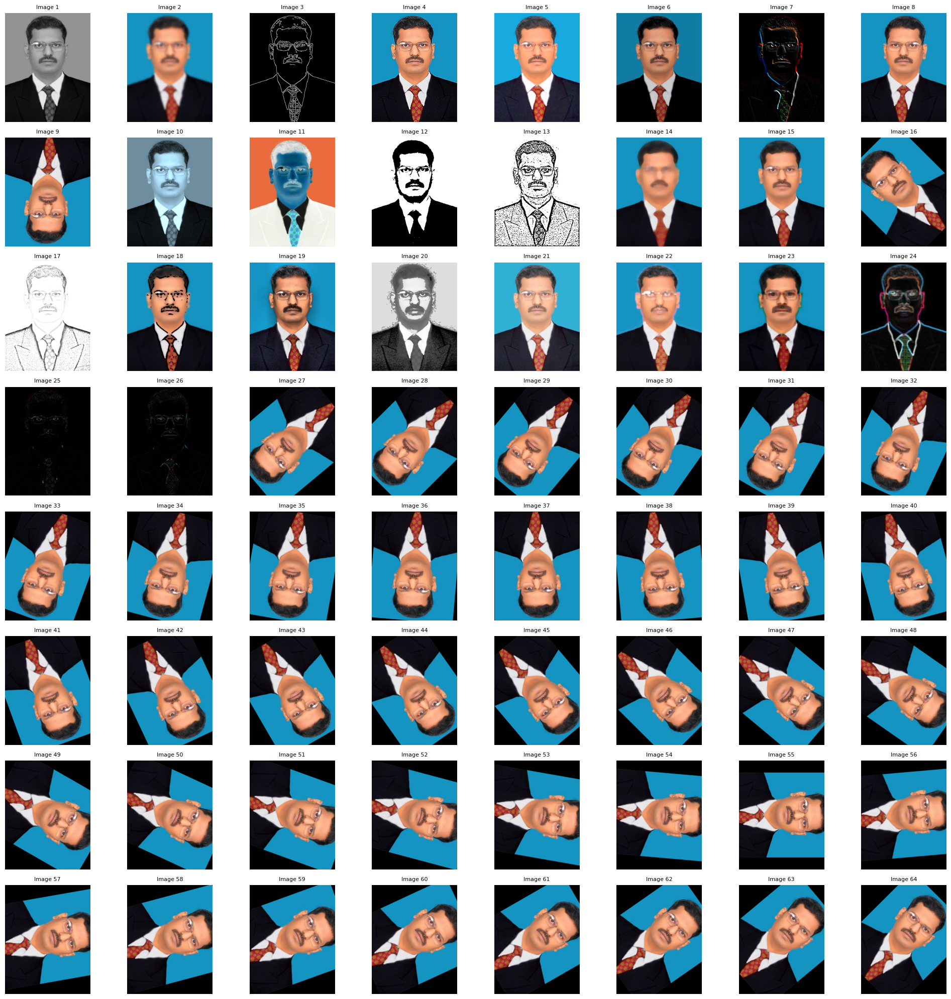

In [ ]:
import cv2
from matplotlib import pyplot as plt
import numpy as np

# Define the image path
img_path = '/content/drive/MyDrive/Appasami.jpg'

# Load the image
image = cv2.imread(img_path)

# Convert the image from BGR to RGB for displaying purposes
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Define different types of image processing functions
def grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def blur(img, kernel_size=(15, 15)):
    return cv2.GaussianBlur(img, kernel_size, 0)

def edge_detection(img, low_threshold=100, high_threshold=200):
    return cv2.Canny(img, low_threshold, high_threshold)

def sharpen(img):
    kernel = np.array([[0, -1, 0], [-1, 5,-1], [0, -1, 0]])
    return cv2.filter2D(img, -1, kernel)

def brighten(img, value=30):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    v = cv2.add(v, value)
    v = np.clip(v, 0, 255)
    final_hsv = cv2.merge((h, s, v))
    return cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)

def darken(img, value=30):
    return brighten(img, -value)

def emboss(img):
    kernel = np.array([[0,-1,-1],[1,0,-1],[1,1,0]])
    return cv2.filter2D(img, -1, kernel)

def flip_horizontal(img):
    return cv2.flip(img, 1)

def flip_vertical(img):
    return cv2.flip(img, 0)

def sepia(img):
    kernel = np.array([[0.272, 0.534, 0.131],
                       [0.349, 0.686, 0.168],
                       [0.393, 0.769, 0.189]])
    return cv2.transform(img, kernel)

def invert(img):
    return cv2.bitwise_not(img)

def binary_threshold(img):
    gray = grayscale(img)
    _, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
    return thresh

def adaptive_threshold(img):
    gray = grayscale(img)
    return cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

def median_blur(img):
    return cv2.medianBlur(img, 15)

def bilateral_filter(img):
    return cv2.bilateralFilter(img, 9, 75, 75)

def rotate(img, angle=45):
    (h, w) = img.shape[:2]
    center = (w // 2, h // 2)
    matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    return cv2.warpAffine(img, matrix, (w, h))

def pencil_sketch(img):
    gray_img = grayscale(img)
    inverted_img = invert(gray_img)
    blur_img = cv2.GaussianBlur(inverted_img, (21, 21), 0)
    sketch = cv2.divide(gray_img, 255 - blur_img, scale=256)
    return sketch

def cartoon(img):
    gray = grayscale(img)
    gray = cv2.medianBlur(gray, 5)
    edges = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 9, 9)
    color = cv2.bilateralFilter(img, 9, 300, 300)
    cartoon = cv2.bitwise_and(color, color, mask=edges)
    return cartoon

def clahe(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    v_clahe = clahe.apply(v)
    final_hsv = cv2.merge((h, s, v_clahe))
    return cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)

def histogram_equalization(img):
    gray = grayscale(img)
    return cv2.equalizeHist(gray)

def gamma_correction(img, gamma=1.5):
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(img, table)

def dilation(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.dilate(img, kernel, iterations=1)

def erosion(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.erode(img, kernel, iterations=1)

def gradient(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)

def top_hat(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.morphologyEx(img, cv2.MORPH_TOPHAT, kernel)

def black_hat(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.morphologyEx(img, cv2.MORPH_BLACKHAT, kernel)

# List of processed images
processed_images = [
    grayscale(image_rgb), blur(image_rgb), edge_detection(image_rgb), sharpen(image_rgb),
    brighten(image_rgb), darken(image_rgb), emboss(image_rgb), flip_horizontal(image_rgb),
    flip_vertical(image_rgb), sepia(image_rgb), invert(image_rgb), binary_threshold(image_rgb),
    adaptive_threshold(image_rgb), median_blur(image_rgb), bilateral_filter(image_rgb), rotate(image_rgb),
    pencil_sketch(image_rgb), cartoon(image_rgb), clahe(image_rgb), histogram_equalization(image_rgb),
    gamma_correction(image_rgb), dilation(image_rgb), erosion(image_rgb), gradient(image_rgb),
    top_hat(image_rgb), black_hat(image_rgb)
]

# Repeat or modify filters to make up 64
while len(processed_images) < 64:
    processed_images.append(rotate(image_rgb, angle=len(processed_images)*5))  # Fill with rotated images

# Titles for the processed images
titles = [f"Image {i+1}" for i in range(64)]

# Plot 8x8 grid of processed images
plt.figure(figsize=(20, 20))
for i in range(64):
    plt.subplot(8, 8, i+1)
    if len(processed_images[i].shape) == 2:  # For grayscale images
        plt.imshow(processed_images[i], cmap='gray')
    else:
        plt.imshow(processed_images[i])
    plt.title(titles[i], fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()


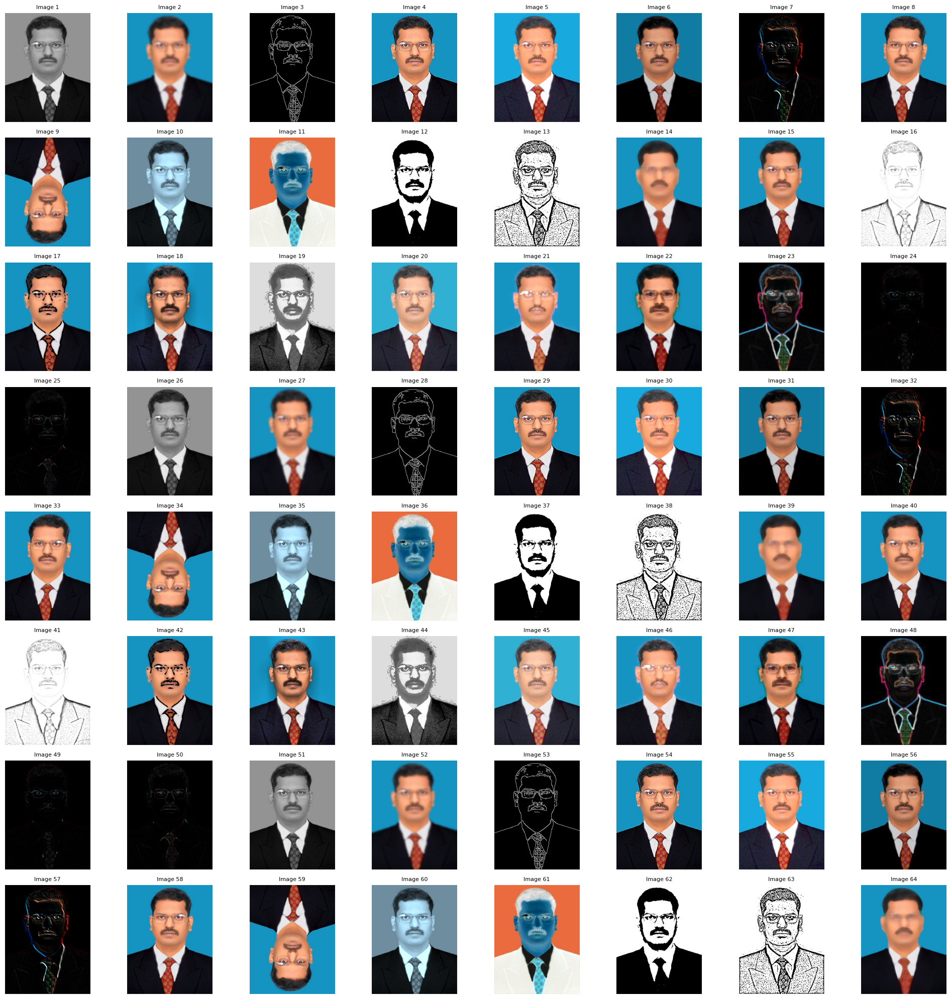

In [ ]:
import cv2
from matplotlib import pyplot as plt
import numpy as np

# Define the image path
img_path = '/content/drive/MyDrive/Appasami.jpg'

# Load the image
image = cv2.imread(img_path)

# Convert the image from BGR to RGB for displaying purposes
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Define different types of image processing functions
def grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def blur(img, kernel_size=(15, 15)):
    return cv2.GaussianBlur(img, kernel_size, 0)

def edge_detection(img, low_threshold=100, high_threshold=200):
    return cv2.Canny(img, low_threshold, high_threshold)

def sharpen(img):
    kernel = np.array([[0, -1, 0], [-1, 5,-1], [0, -1, 0]])
    return cv2.filter2D(img, -1, kernel)

def brighten(img, value=30):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    v = cv2.add(v, value)
    v = np.clip(v, 0, 255)
    final_hsv = cv2.merge((h, s, v))
    return cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)

def darken(img, value=30):
    return brighten(img, -value)

def emboss(img):
    kernel = np.array([[0,-1,-1],[1,0,-1],[1,1,0]])
    return cv2.filter2D(img, -1, kernel)

def flip_horizontal(img):
    return cv2.flip(img, 1)

def flip_vertical(img):
    return cv2.flip(img, 0)

def sepia(img):
    kernel = np.array([[0.272, 0.534, 0.131],
                       [0.349, 0.686, 0.168],
                       [0.393, 0.769, 0.189]])
    return cv2.transform(img, kernel)

def invert(img):
    return cv2.bitwise_not(img)

def binary_threshold(img):
    gray = grayscale(img)
    _, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
    return thresh

def adaptive_threshold(img):
    gray = grayscale(img)
    return cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

def median_blur(img):
    return cv2.medianBlur(img, 15)

def bilateral_filter(img):
    return cv2.bilateralFilter(img, 9, 75, 75)

def pencil_sketch(img):
    gray_img = grayscale(img)
    inverted_img = invert(gray_img)
    blur_img = cv2.GaussianBlur(inverted_img, (21, 21), 0)
    sketch = cv2.divide(gray_img, 255 - blur_img, scale=256)
    return sketch

def cartoon(img):
    gray = grayscale(img)
    gray = cv2.medianBlur(gray, 5)
    edges = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 9, 9)
    color = cv2.bilateralFilter(img, 9, 300, 300)
    cartoon = cv2.bitwise_and(color, color, mask=edges)
    return cartoon

def clahe(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    v_clahe = clahe.apply(v)
    final_hsv = cv2.merge((h, s, v_clahe))
    return cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)

def histogram_equalization(img):
    gray = grayscale(img)
    return cv2.equalizeHist(gray)

def gamma_correction(img, gamma=1.5):
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(img, table)

def dilation(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.dilate(img, kernel, iterations=1)

def erosion(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.erode(img, kernel, iterations=1)

def gradient(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)

def top_hat(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.morphologyEx(img, cv2.MORPH_TOPHAT, kernel)

def black_hat(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.morphologyEx(img, cv2.MORPH_BLACKHAT, kernel)

# List of processed images
processed_images = [
    grayscale(image_rgb), blur(image_rgb), edge_detection(image_rgb), sharpen(image_rgb),
    brighten(image_rgb), darken(image_rgb), emboss(image_rgb), flip_horizontal(image_rgb),
    flip_vertical(image_rgb), sepia(image_rgb), invert(image_rgb), binary_threshold(image_rgb),
    adaptive_threshold(image_rgb), median_blur(image_rgb), bilateral_filter(image_rgb),
    pencil_sketch(image_rgb), cartoon(image_rgb), clahe(image_rgb), histogram_equalization(image_rgb),
    gamma_correction(image_rgb), dilation(image_rgb), erosion(image_rgb), gradient(image_rgb),
    top_hat(image_rgb), black_hat(image_rgb)
]

# Replicate some images to ensure we have exactly 64 images
while len(processed_images) < 64:
    processed_images.extend(processed_images[:64 - len(processed_images)])

# Titles for the processed images
titles = [f"Image {i+1}" for i in range(64)]

# Plot 8x8 grid of processed images
plt.figure(figsize=(20, 20))
for i in range(64):
    plt.subplot(8, 8, i+1)
    if len(processed_images[i].shape) == 2:  # For grayscale images
        plt.imshow(processed_images[i], cmap='gray')
    else:
        plt.imshow(processed_images[i])
    plt.title(titles[i], fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()


IndexError: list index out of range

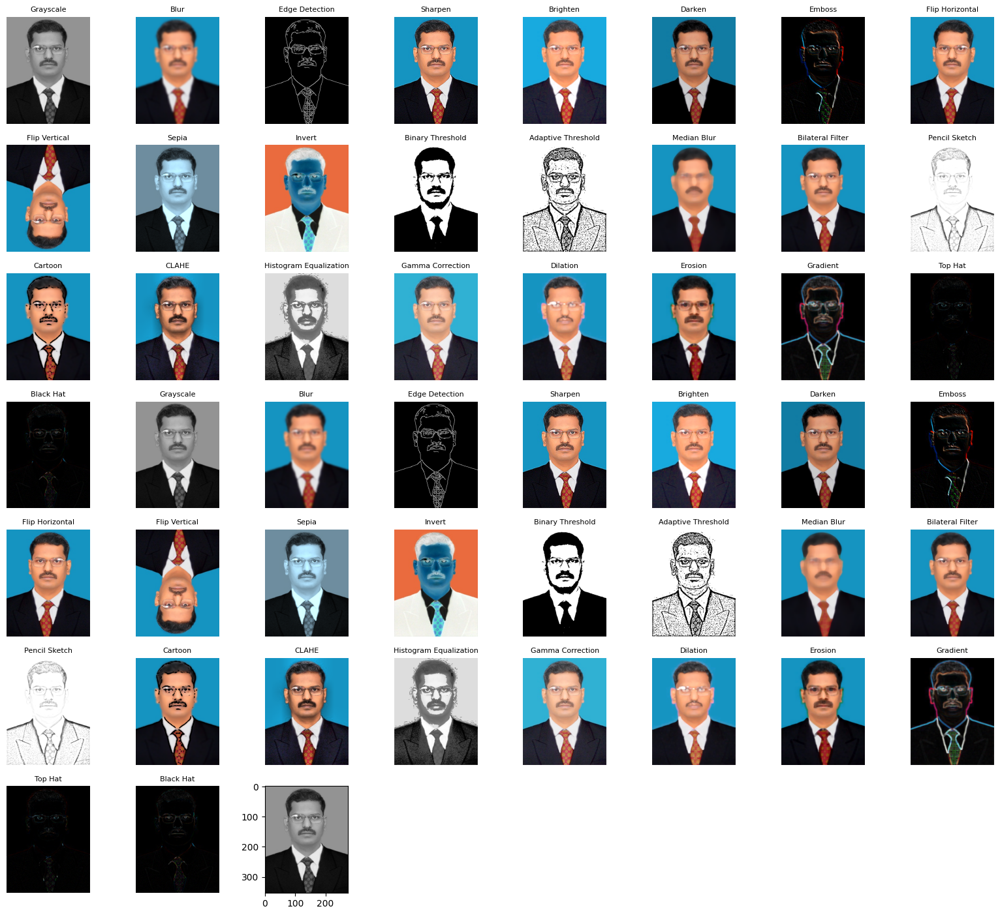

In [ ]:
import cv2
from matplotlib import pyplot as plt
import numpy as np

# Define the image path
img_path = '/content/drive/MyDrive/Appasami.jpg'

# Load the image
image = cv2.imread(img_path)

# Convert the image from BGR to RGB for displaying purposes
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Define different types of image processing functions
def grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def blur(img, kernel_size=(15, 15)):
    return cv2.GaussianBlur(img, kernel_size, 0)

def edge_detection(img, low_threshold=100, high_threshold=200):
    return cv2.Canny(img, low_threshold, high_threshold)

def sharpen(img):
    kernel = np.array([[0, -1, 0], [-1, 5,-1], [0, -1, 0]])
    return cv2.filter2D(img, -1, kernel)

def brighten(img, value=30):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    v = cv2.add(v, value)
    v = np.clip(v, 0, 255)
    final_hsv = cv2.merge((h, s, v))
    return cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)

def darken(img, value=30):
    return brighten(img, -value)

def emboss(img):
    kernel = np.array([[0,-1,-1],[1,0,-1],[1,1,0]])
    return cv2.filter2D(img, -1, kernel)

def flip_horizontal(img):
    return cv2.flip(img, 1)

def flip_vertical(img):
    return cv2.flip(img, 0)

def sepia(img):
    kernel = np.array([[0.272, 0.534, 0.131],
                       [0.349, 0.686, 0.168],
                       [0.393, 0.769, 0.189]])
    return cv2.transform(img, kernel)

def invert(img):
    return cv2.bitwise_not(img)

def binary_threshold(img):
    gray = grayscale(img)
    _, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
    return thresh

def adaptive_threshold(img):
    gray = grayscale(img)
    return cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

def median_blur(img):
    return cv2.medianBlur(img, 15)

def bilateral_filter(img):
    return cv2.bilateralFilter(img, 9, 75, 75)

def pencil_sketch(img):
    gray_img = grayscale(img)
    inverted_img = invert(gray_img)
    blur_img = cv2.GaussianBlur(inverted_img, (21, 21), 0)
    sketch = cv2.divide(gray_img, 255 - blur_img, scale=256)
    return sketch

def cartoon(img):
    gray = grayscale(img)
    gray = cv2.medianBlur(gray, 5)
    edges = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 9, 9)
    color = cv2.bilateralFilter(img, 9, 300, 300)
    cartoon = cv2.bitwise_and(color, color, mask=edges)
    return cartoon

def clahe(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    v_clahe = clahe.apply(v)
    final_hsv = cv2.merge((h, s, v_clahe))
    return cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)

def histogram_equalization(img):
    gray = grayscale(img)
    return cv2.equalizeHist(gray)

def gamma_correction(img, gamma=1.5):
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(img, table)

def dilation(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.dilate(img, kernel, iterations=1)

def erosion(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.erode(img, kernel, iterations=1)

def gradient(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)

def top_hat(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.morphologyEx(img, cv2.MORPH_TOPHAT, kernel)

def black_hat(img):
    kernel = np.ones((5,5), np.uint8)
    return cv2.morphologyEx(img, cv2.MORPH_BLACKHAT, kernel)

# List of processed images and their titles
processed_images = [
    grayscale(image_rgb), blur(image_rgb), edge_detection(image_rgb), sharpen(image_rgb),
    brighten(image_rgb), darken(image_rgb), emboss(image_rgb), flip_horizontal(image_rgb),
    flip_vertical(image_rgb), sepia(image_rgb), invert(image_rgb), binary_threshold(image_rgb),
    adaptive_threshold(image_rgb), median_blur(image_rgb), bilateral_filter(image_rgb),
    pencil_sketch(image_rgb), cartoon(image_rgb), clahe(image_rgb), histogram_equalization(image_rgb),
    gamma_correction(image_rgb), dilation(image_rgb), erosion(image_rgb), gradient(image_rgb),
    top_hat(image_rgb), black_hat(image_rgb)
]

# Replicate some images to ensure we have exactly 64 images
while len(processed_images) < 64:
    processed_images.extend(processed_images[:64 - len(processed_images)])

# Titles for the processed images
operation_names = [
    "Grayscale", "Blur", "Edge Detection", "Sharpen", "Brighten", "Darken", "Emboss",
    "Flip Horizontal", "Flip Vertical", "Sepia", "Invert", "Binary Threshold",
    "Adaptive Threshold", "Median Blur", "Bilateral Filter", "Pencil Sketch",
    "Cartoon", "CLAHE", "Histogram Equalization", "Gamma Correction", "Dilation",
    "Erosion", "Gradient", "Top Hat", "Black Hat"
]

titles = operation_names * 2  # Extend titles to cover all images

# Plot 8x8 grid of processed images
plt.figure(figsize=(20, 20))
for i in range(64):
    plt.subplot(8, 8, i+1)
    if len(processed_images[i].shape) == 2:  # For grayscale images
        plt.imshow(processed_images[i], cmap='gray')
    else:
        plt.imshow(processed_images[i])
    plt.title(titles[i], fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, FloatSlider, RadioButtons, IntSlider, Button, HBox, VBox
from PIL import Image, ImageEnhance

# Load an image using PIL
img_path = '/content/drive/MyDrive/lr.png'  # replace with your image path
img = Image.open(img_path)

# Convert image to a NumPy array
img_array = np.array(img)

# Function to apply image transformations
def edit_image(r_factor, g_factor, b_factor, brightness, contrast, rotation, flip, color_mode):
    img_mod = img_array.copy()

    # Convert back to PIL image for further editing
    img_mod_pil = Image.fromarray(img_mod)

    # Apply brightness and contrast adjustments
    enhancer_bright = ImageEnhance.Brightness(img_mod_pil)
    img_mod_pil = enhancer_bright.enhance(brightness)

    enhancer_contrast = ImageEnhance.Contrast(img_mod_pil)
    img_mod_pil = enhancer_contrast.enhance(contrast)

    # Apply color transformations based on the radio button input
    img_mod = np.array(img_mod_pil)
    if color_mode == 'Red':
        img_mod[..., 0] = img_mod[..., 0] * r_factor
    elif color_mode == 'Green':
        img_mod[..., 1] = img_mod[..., 1] * g_factor
    elif color_mode == 'Blue':
        img_mod[..., 2] = img_mod[..., 2] * b_factor
    else:
        img_mod[..., 0] = img_mod[..., 0] * r_factor
        img_mod[..., 1] = img_mod[..., 1] * g_factor
        img_mod[..., 2] = img_mod[..., 2] * b_factor

    img_mod = np.clip(img_mod, 0, 255).astype(np.uint8)

    # Convert the result back to PIL image
    img_mod_pil = Image.fromarray(img_mod)

    # Apply rotation
    img_mod_pil = img_mod_pil.rotate(rotation, expand=True)

    # Apply flipping if requested
    if flip == 'Horizontal':
        img_mod_pil = img_mod_pil.transpose(Image.FLIP_LEFT_RIGHT)
    elif flip == 'Vertical':
        img_mod_pil = img_mod_pil.transpose(Image.FLIP_TOP_BOTTOM)

    # Display the modified image
    plt.imshow(img_mod_pil)
    plt.axis('off')
    plt.show()

# Creating the interactive sliders and buttons for various options
r_slider = FloatSlider(value=1, min=0, max=2, step=0.1, description='Red')
g_slider = FloatSlider(value=1, min=0, max=2, step=0.1, description='Green')
b_slider = FloatSlider(value=1, min=0, max=2, step=0.1, description='Blue')
brightness_slider = FloatSlider(value=1, min=0, max=2, step=0.1, description='Brightness')
contrast_slider = FloatSlider(value=1, min=0, max=2, step=0.1, description='Contrast')
rotation_slider = IntSlider(value=0, min=0, max=360, step=15, description='Rotation')

color_mode_radio = RadioButtons(
    options=['All', 'Red', 'Green', 'Blue'],
    value='All',
    description='Color Mode'
)

flip_radio = RadioButtons(
    options=['None', 'Horizontal', 'Vertical'],
    value='None',
    description='Flip'
)

# Display the interactive widgets using HBox and VBox layout
ui = VBox([
    HBox([r_slider, g_slider, b_slider]),
    HBox([brightness_slider, contrast_slider]),
    HBox([rotation_slider, flip_radio]),
    color_mode_radio
])

# Display the interactive GUI and call the function
interact(edit_image, r_factor=r_slider, g_factor=g_slider, b_factor=b_slider,
         brightness=brightness_slider, contrast=contrast_slider,
         rotation=rotation_slider, flip=flip_radio, color_mode=color_mode_radio)

interactive(children=(FloatSlider(value=1.0, description='Red', max=2.0), FloatSlider(value=1.0, description='…

<function __main__.edit_image(r_factor, g_factor, b_factor, brightness, contrast, rotation, flip, color_mode)>

In [ ]:
from PIL import Image, ImageOps

# Load the image from the specified path
img_path = '/content/drive/MyDrive/lr.png'
img = Image.open(img_path)

# Invert the colors of the image
inverted_img = ImageOps.invert(img.convert("RGB"))

# Save the inverted image, keeping the same size
inverted_img.save('/content/drive/MyDrive/inverted_lr.png')

# Optionally, show the inverted image
inverted_img.show()


In [ ]:
pip install rembg

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.2/13.2 MB 51.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 5.5 MB/s eta 0:00:00


In [ ]:
from rembg import remove
from PIL import Image
import io

# Load the image from the specified path
img_path = '/content/drive/MyDrive/lr.png'

with open(img_path, 'rb') as input_file:
    img_data = input_file.read()

# Remove the background
output_data = remove(img_data)

# Convert the output to an image
output_img = Image.open(io.BytesIO(output_data))

# Save the output image without background
output_img.save('/content/drive/MyDrive/lr_no_background.png')

# Optionally, display the output image
output_img.show()


100%|████████████████████████████████████████| 176M/176M [00:00<00:00, 109GB/s]


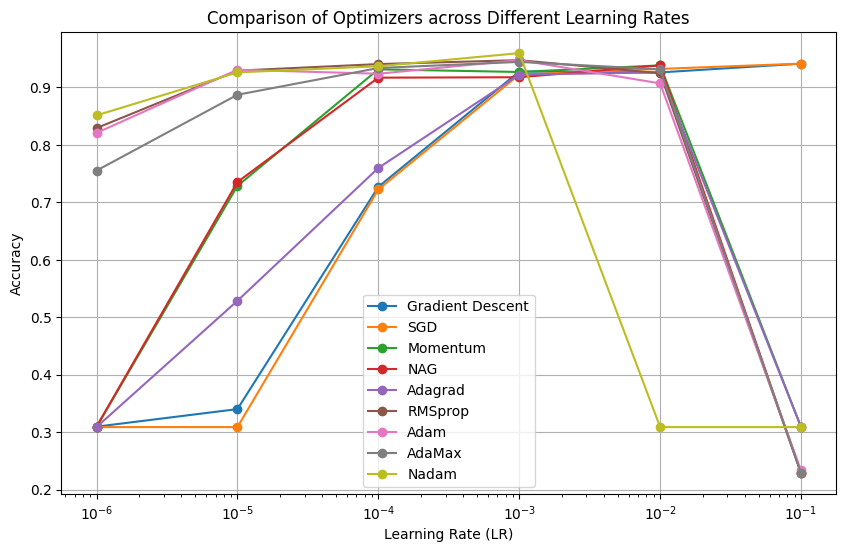

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data for different optimizers at various learning rates
learning_rates = [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001]
GD = [0.941266, 0.926011, 0.927536, 0.726926, 0.340198, 0.309687]
SGD = [0.941266, 0.932113, 0.922197, 0.722349, 0.308925, 0.308925]
Momentum = [0.308925, 0.938215, 0.926773, 0.93135, 0.728452, 0.308925]
NAG = [0.228833, 0.938215, 0.91762, 0.916857, 0.735317, 0.309687]
Adagrad = [0.308925, 0.926011, 0.922197, 0.759725, 0.528604, 0.308925]
RMSprop = [0.228833, 0.924485, 0.947368, 0.940503, 0.929062, 0.829138]
Adam = [0.23341, 0.906941, 0.947368, 0.923722, 0.930587, 0.820748]
AdaMax = [0.228833, 0.93135, 0.944317, 0.933638, 0.887109, 0.755149]
Nadam = [0.308925, 0.308925, 0.959573, 0.93669, 0.926011, 0.851259]

# Plotting the results
plt.figure(figsize=(10, 6))

plt.plot(learning_rates, GD, marker='o', label='Gradient Descent')
plt.plot(learning_rates, SGD, marker='o', label='SGD')
plt.plot(learning_rates, Momentum, marker='o', label='Momentum')
plt.plot(learning_rates, NAG, marker='o', label='NAG')
plt.plot(learning_rates, Adagrad, marker='o', label='Adagrad')
plt.plot(learning_rates, RMSprop, marker='o', label='RMSprop')
plt.plot(learning_rates, Adam, marker='o', label='Adam')
plt.plot(learning_rates, AdaMax, marker='o', label='AdaMax')
plt.plot(learning_rates, Nadam, marker='o', label='Nadam')

# Customizing the plot
plt.xscale('log')  # Logarithmic scale for Learning Rates
plt.xlabel('Learning Rate (LR)')
plt.ylabel('Accuracy')
plt.title('Comparison of Optimizers across Different Learning Rates')
plt.legend(loc='best')
plt.grid(True)

# Show plot
plt.show()


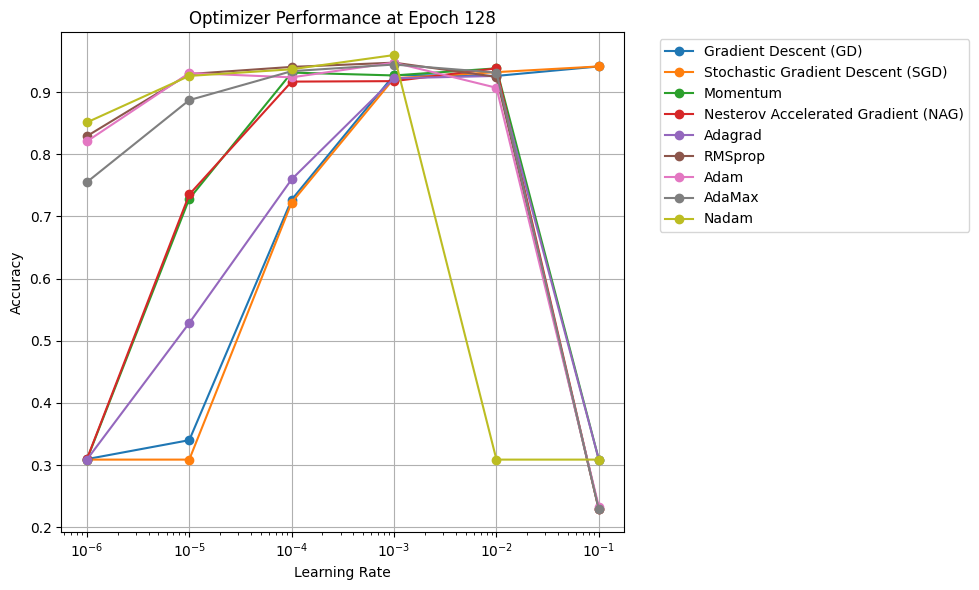

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Data
learning_rates = [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001]
optimizers = [
    "Gradient Descent (GD)", "Stochastic Gradient Descent (SGD)", "Momentum",
    "Nesterov Accelerated Gradient (NAG)", "Adagrad", "RMSprop", "Adam", "AdaMax", "Nadam"
]
accuracy_values = np.array([
    [0.941266, 0.941266, 0.308925, 0.228833, 0.308925, 0.228833, 0.23341, 0.228833, 0.308925],
    [0.926011, 0.932113, 0.938215, 0.938215, 0.926011, 0.924485, 0.906941, 0.93135, 0.308925],
    [0.927536, 0.922197, 0.926773, 0.91762, 0.922197, 0.947368, 0.947368, 0.944317, 0.959573],
    [0.726926, 0.722349, 0.93135, 0.916857, 0.759725, 0.940503, 0.923722, 0.933638, 0.93669],
    [0.340198, 0.308925, 0.728452, 0.735317, 0.528604, 0.929062, 0.930587, 0.887109, 0.926011],
    [0.309687, 0.308925, 0.308925, 0.309687, 0.308925, 0.829138, 0.820748, 0.755149, 0.851259]
])

# Plotting the data
plt.figure(figsize=(10, 6))
for i, optimizer in enumerate(optimizers):
    plt.plot(learning_rates, accuracy_values[:, i], marker='o', label=optimizer)

# Set logarithmic scale for the x-axis (learning rates)
plt.xscale('log')

# Adding labels and title
plt.xlabel('Learning Rate')
plt.ylabel('Accuracy')
plt.title('Optimizer Performance at Epoch 128')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

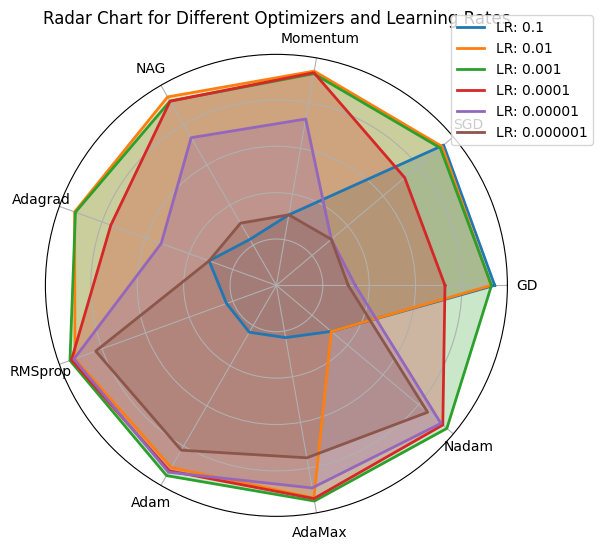

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the data for the radar chart
labels = ['GD', 'SGD', 'Momentum', 'NAG', 'Adagrad', 'RMSprop', 'Adam', 'AdaMax', 'Nadam']
lr_values = ['0.1', '0.01', '0.001', '0.0001', '0.00001', '0.000001']

data = {
    '0.1': [0.941266, 0.941266, 0.308925, 0.228833, 0.308925, 0.228833, 0.23341, 0.228833, 0.308925],
    '0.01': [0.926011, 0.932113, 0.938215, 0.938215, 0.926011, 0.924485, 0.906941, 0.93135, 0.308925],
    '0.001': [0.927536, 0.922197, 0.926773, 0.91762, 0.922197, 0.947368, 0.947368, 0.944317, 0.959573],
    '0.0001': [0.726926, 0.722349, 0.93135, 0.916857, 0.759725, 0.940503, 0.923722, 0.933638, 0.93669],
    '0.00001': [0.340198, 0.308925, 0.728452, 0.735317, 0.528604, 0.929062, 0.930587, 0.887109, 0.926011],
    '0.000001': [0.309687, 0.308925, 0.308925, 0.309687, 0.308925, 0.829138, 0.820748, 0.755149, 0.851259]
}

# Number of variables
num_vars = len(labels)

# Compute angle for each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is circular, so we need to "complete the loop" and append the start to the end.
angles += angles[:1]

# Create radar chart for each learning rate
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

for lr, values in data.items():
    values += values[:1]  # complete the loop
    ax.plot(angles, values, linewidth=2, linestyle='solid', label=f'LR: {lr}')
    ax.fill(angles, values, alpha=0.25)

# Labels for each axis
ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

# Add a title and legend
plt.title('Radar Chart for Different Optimizers and Learning Rates')
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1))

# Show the plot
plt.show()

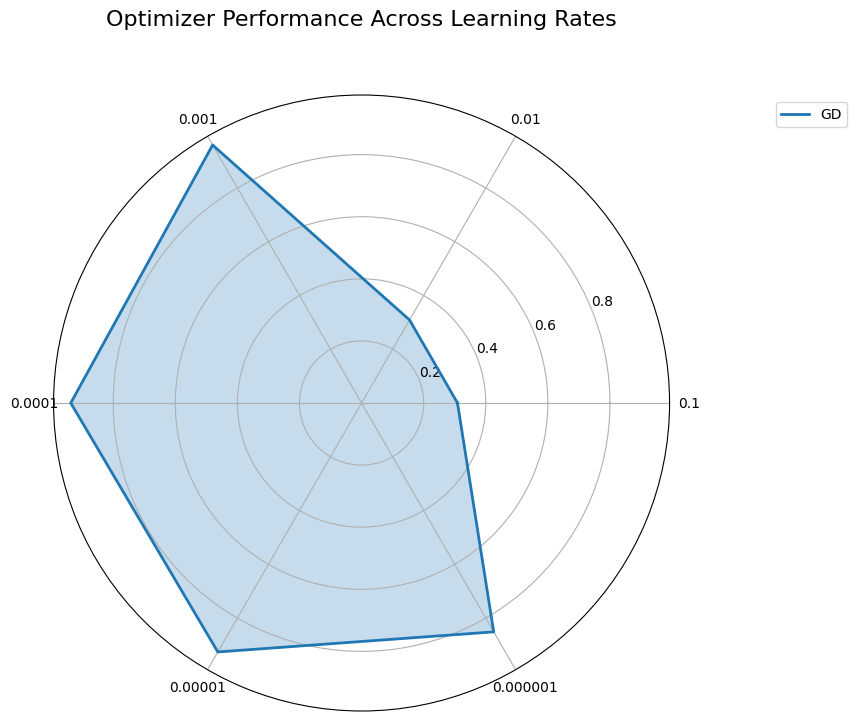

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from math import pi

# Define the data for the radar chart
labels = ['0.1', '0.01', '0.001', '0.0001', '0.00001', '0.000001']
categories = ['GD', 'SGD', 'Momentum', 'NAG', 'Adagrad', 'RMSprop', 'Adam', 'AdaMax', 'Nadam']

# Accuracy values for each optimizer

data = [
    [0.941266, 0.926011, 0.927536, 0.726926, 0.340198, 0.309687],  # GD
    [0.941266, 0.932113, 0.922197, 0.722349, 0.308925, 0.308925],  # SGD
    [0.308925, 0.938215, 0.926773, 0.93135, 0.728452, 0.308925],   # Momentum
    [0.228833, 0.938215, 0.91762, 0.916857, 0.735317, 0.309687],   # NAG
    [0.308925, 0.926011, 0.922197, 0.759725, 0.528604, 0.308925],  # Adagrad
    [0.228833, 0.924485, 0.947368, 0.940503, 0.929062, 0.829138],  # RMSprop
    [0.23341, 0.906941, 0.947368, 0.923722, 0.930587, 0.820748],   # Adam
    [0.228833, 0.93135, 0.944317, 0.933638, 0.887109, 0.755149],   # AdaMax
    [0.308925, 0.308925, 0.959573, 0.93669, 0.926011, 0.851259]    # Nadam
]


# Number of variables
num_vars = len(labels)

# Compute angle for each category
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += angles[:1]  # Complete the loop

# Radar plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# Plot each optimizer's data on the radar chart
for i, category_data in enumerate(data):
    values = category_data + category_data[:1]  # Repeat first value to close the loop
    ax.plot(angles, values, linewidth=2, linestyle='solid', label=categories[i])
    ax.fill(angles, values, alpha=0.25)

# Add labels
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

# Title and legend
plt.title('Optimizer Performance Across Learning Rates', size=16, color='black', y=1.1)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1))

plt.show()


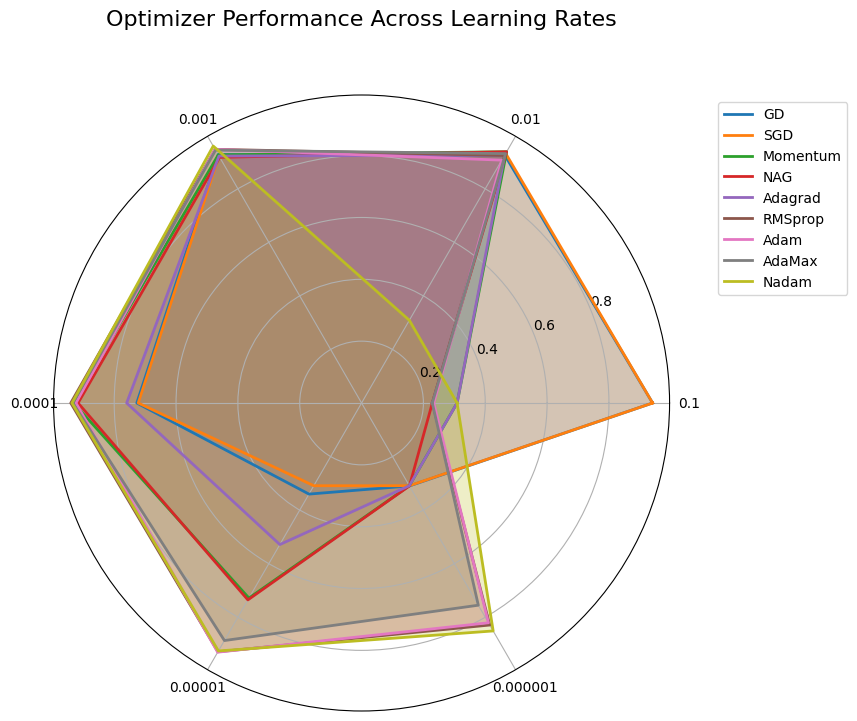

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from math import pi

# Define the data for the radar chart
labels = ['0.1', '0.01', '0.001', '0.0001', '0.00001', '0.000001']
categories = ['GD', 'SGD', 'Momentum', 'NAG', 'Adagrad', 'RMSprop', 'Adam', 'AdaMax', 'Nadam']

# Accuracy values for each optimizer

data = [
    [0.941266, 0.926011, 0.927536, 0.726926, 0.340198, 0.309687],  # GD
    [0.941266, 0.932113, 0.922197, 0.722349, 0.308925, 0.308925],  # SGD
    [0.308925, 0.938215, 0.926773, 0.93135, 0.728452, 0.308925],   # Momentum
    [0.228833, 0.938215, 0.91762, 0.916857, 0.735317, 0.309687],   # NAG
    [0.308925, 0.926011, 0.922197, 0.759725, 0.528604, 0.308925],  # Adagrad
    [0.228833, 0.924485, 0.947368, 0.940503, 0.929062, 0.829138],  # RMSprop
    [0.23341, 0.906941, 0.947368, 0.923722, 0.930587, 0.820748],   # Adam
    [0.228833, 0.93135, 0.944317, 0.933638, 0.887109, 0.755149],   # AdaMax
    [0.308925, 0.308925, 0.959573, 0.93669, 0.926011, 0.851259]    # Nadam
]


# Number of variables
num_vars = len(labels)

# Compute angle for each category
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += angles[:1]  # Complete the loop

# Radar plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# Plot each optimizer's data on the radar chart
for i, category_data in enumerate(data):
    values = category_data + category_data[:1]  # Repeat first value to close the loop
    ax.plot(angles, values, linewidth=2, linestyle='solid', label=categories[i])
    ax.fill(angles, values, alpha=0.25)

# Add labels
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

# Title and legend
plt.title('Optimizer Performance Across Learning Rates', size=16, color='black', y=1.1)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1))

plt.show()


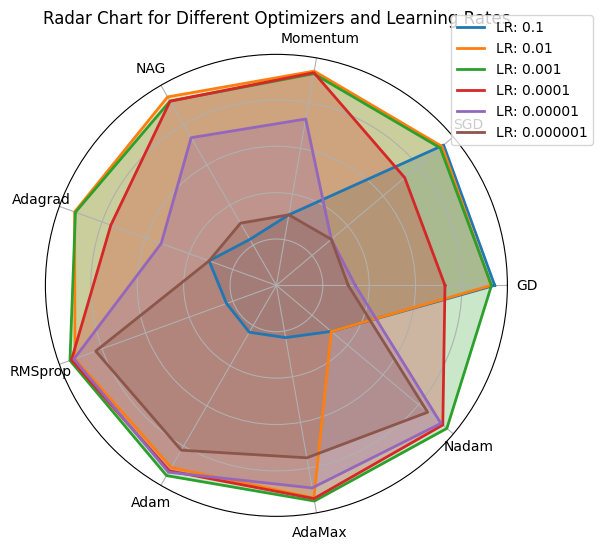

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the data for the radar chart
labels = ['GD', 'SGD', 'Momentum', 'NAG', 'Adagrad', 'RMSprop', 'Adam', 'AdaMax', 'Nadam']
lr_values = ['0.1', '0.01', '0.001', '0.0001', '0.00001', '0.000001']

data = {
    '0.1': [0.941266, 0.941266, 0.308925, 0.228833, 0.308925, 0.228833, 0.23341, 0.228833, 0.308925],
    '0.01': [0.926011, 0.932113, 0.938215, 0.938215, 0.926011, 0.924485, 0.906941, 0.93135, 0.308925],
    '0.001': [0.927536, 0.922197, 0.926773, 0.91762, 0.922197, 0.947368, 0.947368, 0.944317, 0.959573],
    '0.0001': [0.726926, 0.722349, 0.93135, 0.916857, 0.759725, 0.940503, 0.923722, 0.933638, 0.93669],
    '0.00001': [0.340198, 0.308925, 0.728452, 0.735317, 0.528604, 0.929062, 0.930587, 0.887109, 0.926011],
    '0.000001': [0.309687, 0.308925, 0.308925, 0.309687, 0.308925, 0.829138, 0.820748, 0.755149, 0.851259]
}

# Number of variables
num_vars = len(labels)

# Compute angle for each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is circular, so we need to "complete the loop" and append the start to the end.
angles += angles[:1]

# Create radar chart for each learning rate
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

for lr, values in data.items():
    values += values[:1]  # complete the loop
    ax.plot(angles, values, linewidth=2, linestyle='solid', label=f'LR: {lr}')
    ax.fill(angles, values, alpha=0.25)

# Labels for each axis
ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

# Add a title and legend
plt.title('Radar Chart for Different Optimizers and Learning Rates')
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1))

# Show the plot
plt.show()


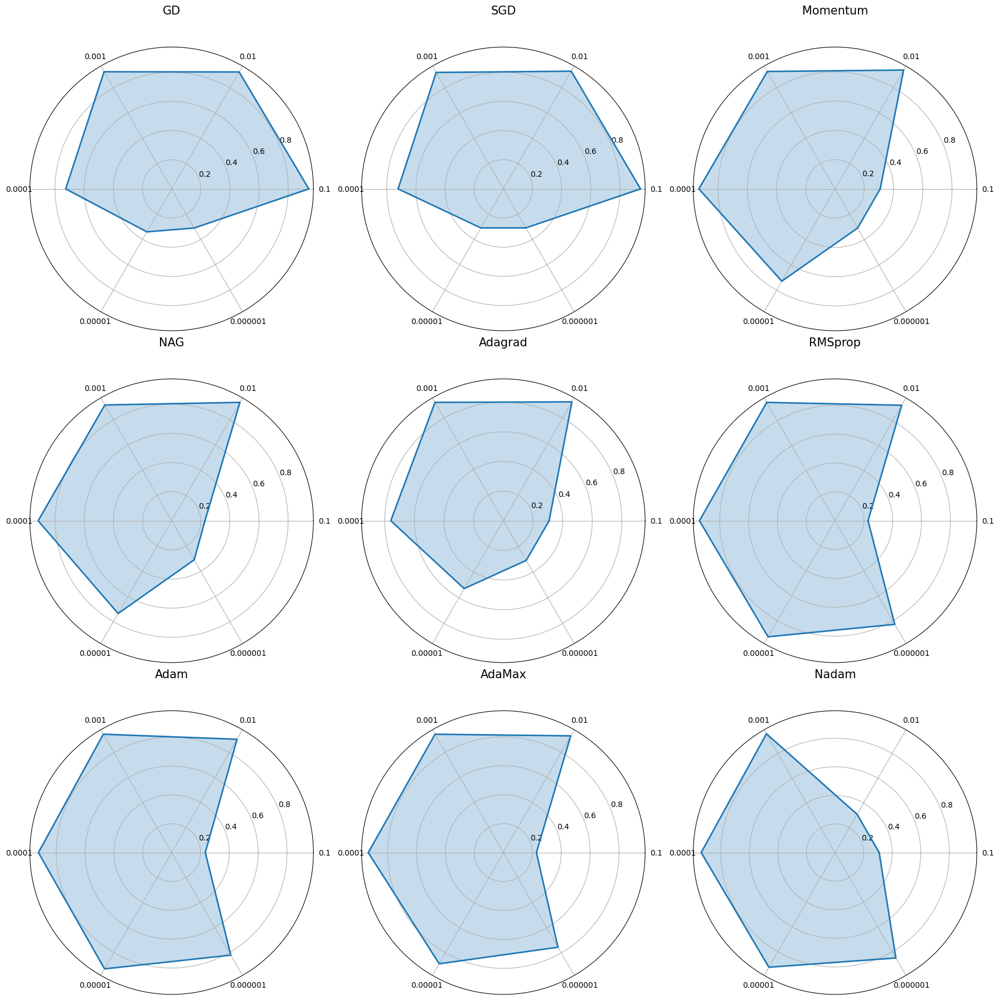

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from math import pi

# Define the data for the radar chart
labels = ['0.1', '0.01', '0.001', '0.0001', '0.00001', '0.000001']
categories = ['GD', 'SGD', 'Momentum', 'NAG', 'Adagrad', 'RMSprop', 'Adam', 'AdaMax', 'Nadam']

# Accuracy values for each optimizer
data = [
    [0.941266, 0.926011, 0.927536, 0.726926, 0.340198, 0.309687],  # GD
    [0.941266, 0.932113, 0.922197, 0.722349, 0.308925, 0.308925],  # SGD
    [0.308925, 0.938215, 0.926773, 0.93135, 0.728452, 0.308925],   # Momentum
    [0.228833, 0.938215, 0.91762, 0.916857, 0.735317, 0.309687],   # NAG
    [0.308925, 0.926011, 0.922197, 0.759725, 0.528604, 0.308925],  # Adagrad
    [0.228833, 0.924485, 0.947368, 0.940503, 0.929062, 0.829138],  # RMSprop
    [0.23341, 0.906941, 0.947368, 0.923722, 0.930587, 0.820748],   # Adam
    [0.228833, 0.93135, 0.944317, 0.933638, 0.887109, 0.755149],   # AdaMax
    [0.308925, 0.308925, 0.959573, 0.93669, 0.926011, 0.851259]    # Nadam
]

# Number of variables (learning rates)
num_vars = len(labels)

# Compute angle for each label on the radar chart
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += angles[:1]  # Complete the loop by connecting the last point to the first

# Create 3x3 subplots for the 9 optimizers
fig, axs = plt.subplots(3, 3, figsize=(18, 18), subplot_kw=dict(polar=True))

# Flatten the axes array for easier iteration
axs = axs.flatten()

# Loop through each optimizer's data and plot on a separate subplot
for i, category_data in enumerate(data):
    ax = axs[i]
    values = category_data + category_data[:1]  # Repeat the first value to close the loop
    ax.plot(angles, values, linewidth=2, linestyle='solid', label=categories[i])
    ax.fill(angles, values, alpha=0.25)

    # Set the category labels on the plot
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)

    # Set the title for each subplot
    ax.set_title(f'{categories[i]}', size=15, color='black', y=1.1)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()


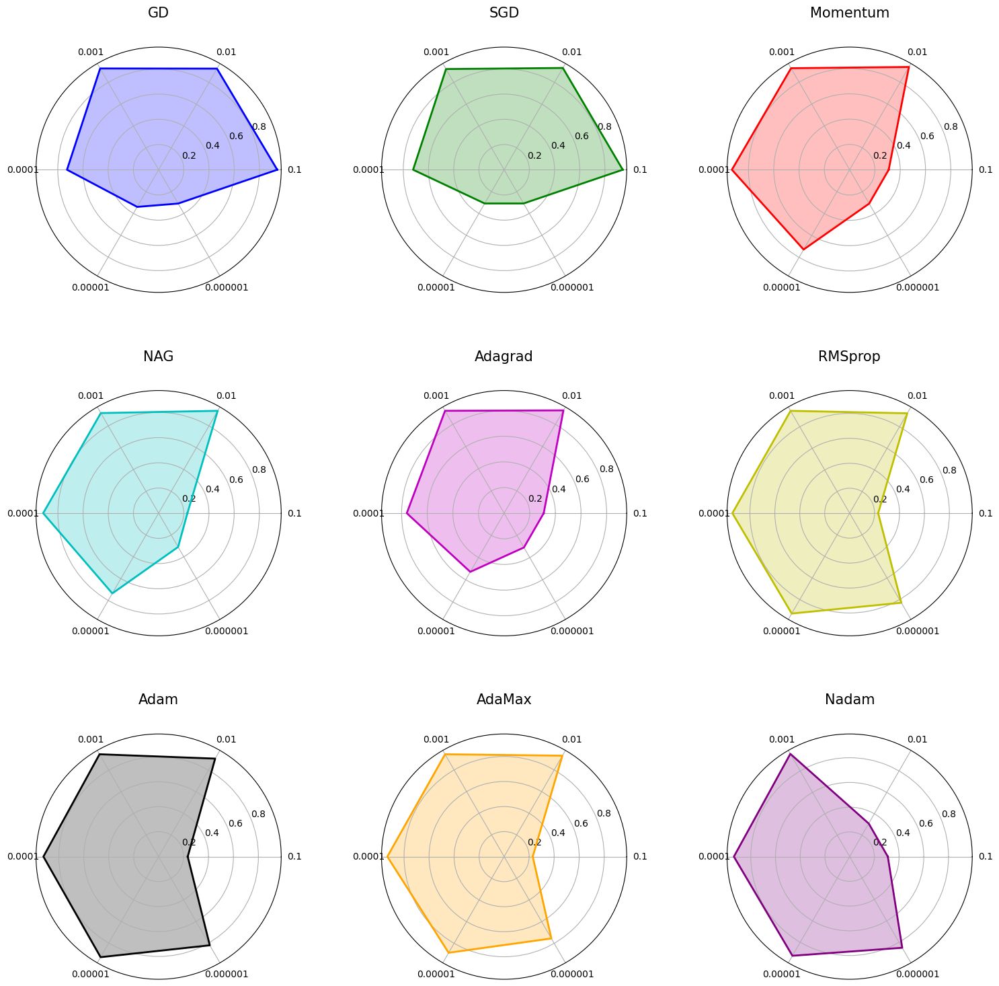

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from math import pi

# Define the data for the radar chart
labels = ['0.1', '0.01', '0.001', '0.0001', '0.00001', '0.000001']
categories = ['GD', 'SGD', 'Momentum', 'NAG', 'Adagrad', 'RMSprop', 'Adam', 'AdaMax', 'Nadam']

# Accuracy values for each optimizer
data = [
    [0.941266, 0.926011, 0.927536, 0.726926, 0.340198, 0.309687],  # GD
    [0.941266, 0.932113, 0.922197, 0.722349, 0.308925, 0.308925],  # SGD
    [0.308925, 0.938215, 0.926773, 0.93135, 0.728452, 0.308925],   # Momentum
    [0.228833, 0.938215, 0.91762, 0.916857, 0.735317, 0.309687],   # NAG
    [0.308925, 0.926011, 0.922197, 0.759725, 0.528604, 0.308925],  # Adagrad
    [0.228833, 0.924485, 0.947368, 0.940503, 0.929062, 0.829138],  # RMSprop
    [0.23341, 0.906941, 0.947368, 0.923722, 0.930587, 0.820748],   # Adam
    [0.228833, 0.93135, 0.944317, 0.933638, 0.887109, 0.755149],   # AdaMax
    [0.308925, 0.308925, 0.959573, 0.93669, 0.926011, 0.851259]    # Nadam
]

# Number of variables (learning rates)
num_vars = len(labels)

# Compute angle for each label on the radar chart
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += angles[:1]  # Complete the loop by connecting the last point to the first

# Define colors for each optimizer
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'orange', 'purple']

# Create 3x3 subplots for the 9 optimizers
fig, axs = plt.subplots(3, 3, figsize=(18, 18), subplot_kw=dict(polar=True))

# Flatten the axes array for easier iteration
axs = axs.flatten()

# Loop through each optimizer's data and plot on a separate subplot with unique color
for i, category_data in enumerate(data):
    ax = axs[i]
    values = category_data + category_data[:1]  # Repeat the first value to close the loop
    ax.plot(angles, values, linewidth=2, linestyle='solid', color=colors[i], label=categories[i])
    ax.fill(angles, values, color=colors[i], alpha=0.25)

    # Set the category labels on the plot
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)

    # Set the title for each subplot
    ax.set_title(f'{categories[i]}', size=15, color='black', y=1.1)

# Add grid-like spacing between subplots
plt.subplots_adjust(wspace=0.4, hspace=0.4)

# Display the plots
plt.show()


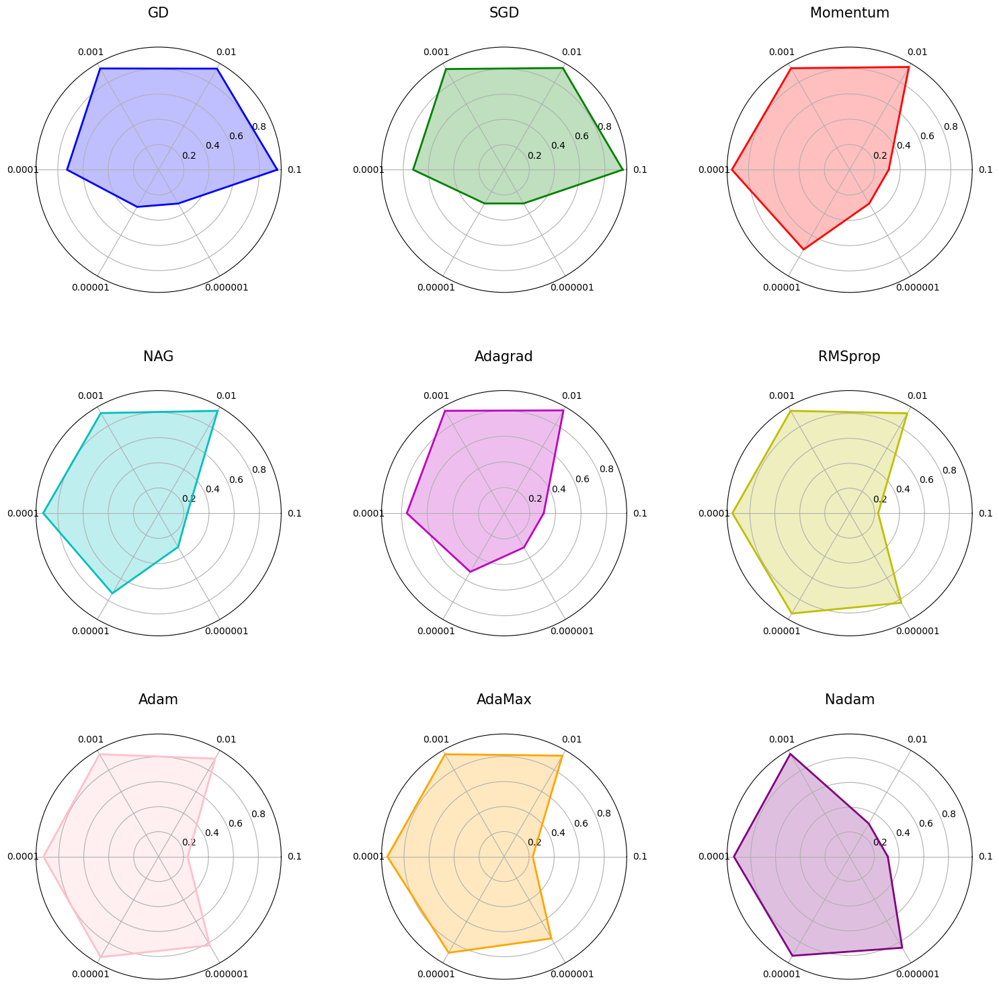

In [ ]:
# Fixed the missing color and ensured grid lines are properly displayed
# Added color to the missing entry and enabled gridlines in the radar chart

# Define colors for each optimizer (fixed missing color for 7th optimizer)
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'pink', 'orange', 'purple']

# Create 3x3 subplots for the 9 optimizers with grid
fig, axs = plt.subplots(3, 3, figsize=(18, 18), subplot_kw=dict(polar=True))

# Flatten the axes array for easier iteration
axs = axs.flatten()

# Loop through each optimizer's data and plot on a separate subplot with unique color
for i, category_data in enumerate(data):
    ax = axs[i]
    values = category_data + category_data[:1]  # Repeat the first value to close the loop
    ax.plot(angles, values, linewidth=2, linestyle='solid', color=colors[i], label=categories[i])
    ax.fill(angles, values, color=colors[i], alpha=0.25)

    # Set gridlines
    ax.grid(True)

    # Set the category labels on the plot
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)

    # Set the title for each subplot
    ax.set_title(f'{categories[i]}', size=15, color='black', y=1.1)

# Add grid-like spacing between subplots
plt.subplots_adjust(wspace=0.4, hspace=0.4)

# Display the plots
plt.show()


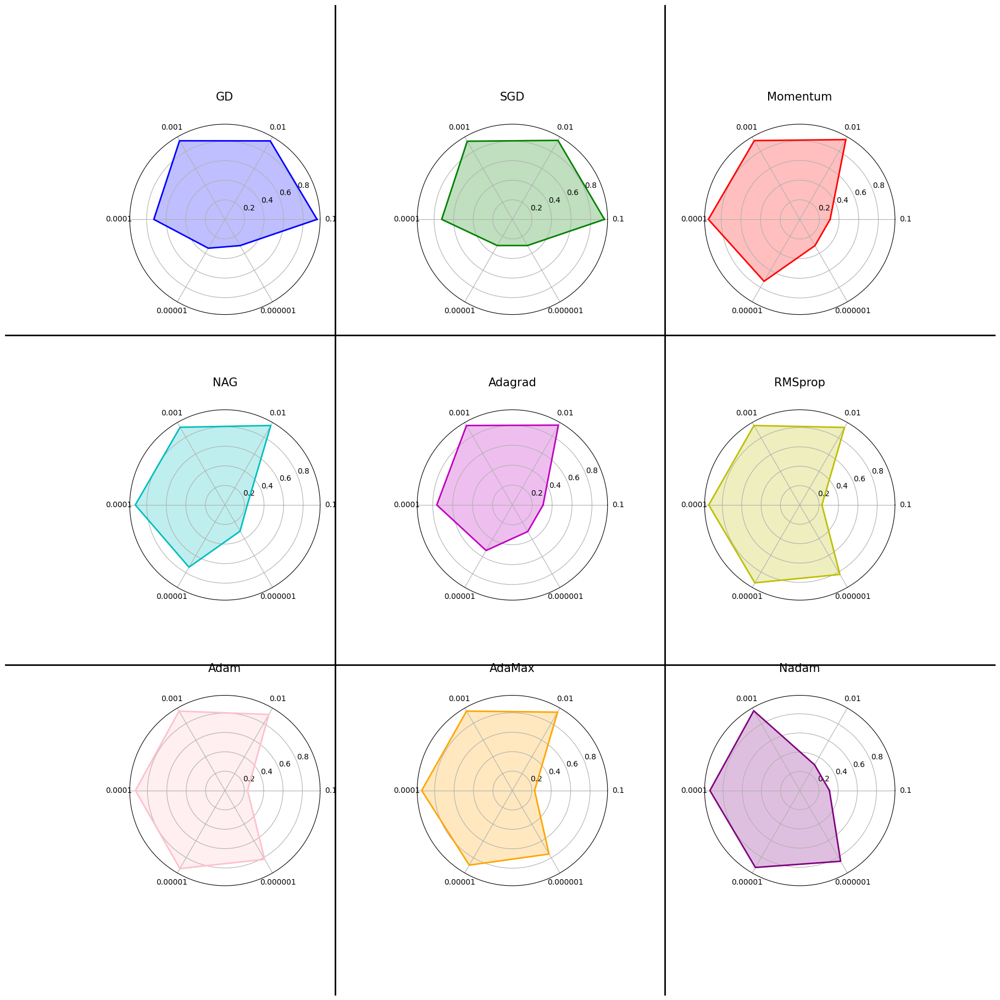

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from math import pi

# Define the data for the radar chart
labels = ['0.1', '0.01', '0.001', '0.0001', '0.00001', '0.000001']
categories = ['GD', 'SGD', 'Momentum', 'NAG', 'Adagrad', 'RMSprop', 'Adam', 'AdaMax', 'Nadam']

# Accuracy values for each optimizer
data = [
    [0.941266, 0.926011, 0.927536, 0.726926, 0.340198, 0.309687],  # GD
    [0.941266, 0.932113, 0.922197, 0.722349, 0.308925, 0.308925],  # SGD
    [0.308925, 0.938215, 0.926773, 0.93135, 0.728452, 0.308925],   # Momentum
    [0.228833, 0.938215, 0.91762, 0.916857, 0.735317, 0.309687],   # NAG
    [0.308925, 0.926011, 0.922197, 0.759725, 0.528604, 0.308925],  # Adagrad
    [0.228833, 0.924485, 0.947368, 0.940503, 0.929062, 0.829138],  # RMSprop
    [0.23341, 0.906941, 0.947368, 0.923722, 0.930587, 0.820748],   # Adam
    [0.228833, 0.93135, 0.944317, 0.933638, 0.887109, 0.755149],   # AdaMax
    [0.308925, 0.308925, 0.959573, 0.93669, 0.926011, 0.851259]    # Nadam
]

# Number of variables (learning rates)
num_vars = len(labels)

# Compute angle for each label on the radar chart
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += angles[:1]  # Complete the loop by connecting the last point to the first

# Define colors for each optimizer (fixed missing color for Adam)
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'pink', 'orange', 'purple']

# Create 3x3 subplots for the 9 optimizers with grid
fig, axs = plt.subplots(3, 3, figsize=(18, 18), subplot_kw=dict(polar=True))

# Flatten the axes array for easier iteration
axs = axs.flatten()

# Loop through each optimizer's data and plot on a separate subplot with unique color
for i, category_data in enumerate(data):
    ax = axs[i]
    values = category_data + category_data[:1]  # Repeat the first value to close the loop
    ax.plot(angles, values, linewidth=2, linestyle='solid', color=colors[i], label=categories[i])
    ax.fill(angles, values, color=colors[i], alpha=0.25)

    # Set gridlines
    ax.grid(True)

    # Set the category labels on the plot
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)

    # Set the title for each subplot
    ax.set_title(f'{categories[i]}', size=15, color='black', y=1.1)

# Adding visible separation lines between subplots
for row in range(1, 3):
    fig.add_artist(Line2D([0, 1], [row / 3, row / 3], color='black', linewidth=2, transform=fig.transFigure))  # Horizontal lines
for col in range(1, 3):
    fig.add_artist(Line2D([col / 3, col / 3], [0, 1], color='black', linewidth=2, transform=fig.transFigure))  # Vertical lines

# Adjust the space between subplots for better visual separation (borderlines)
plt.subplots_adjust(wspace=0.5, hspace=0.5)

# Display the plots
plt.show()



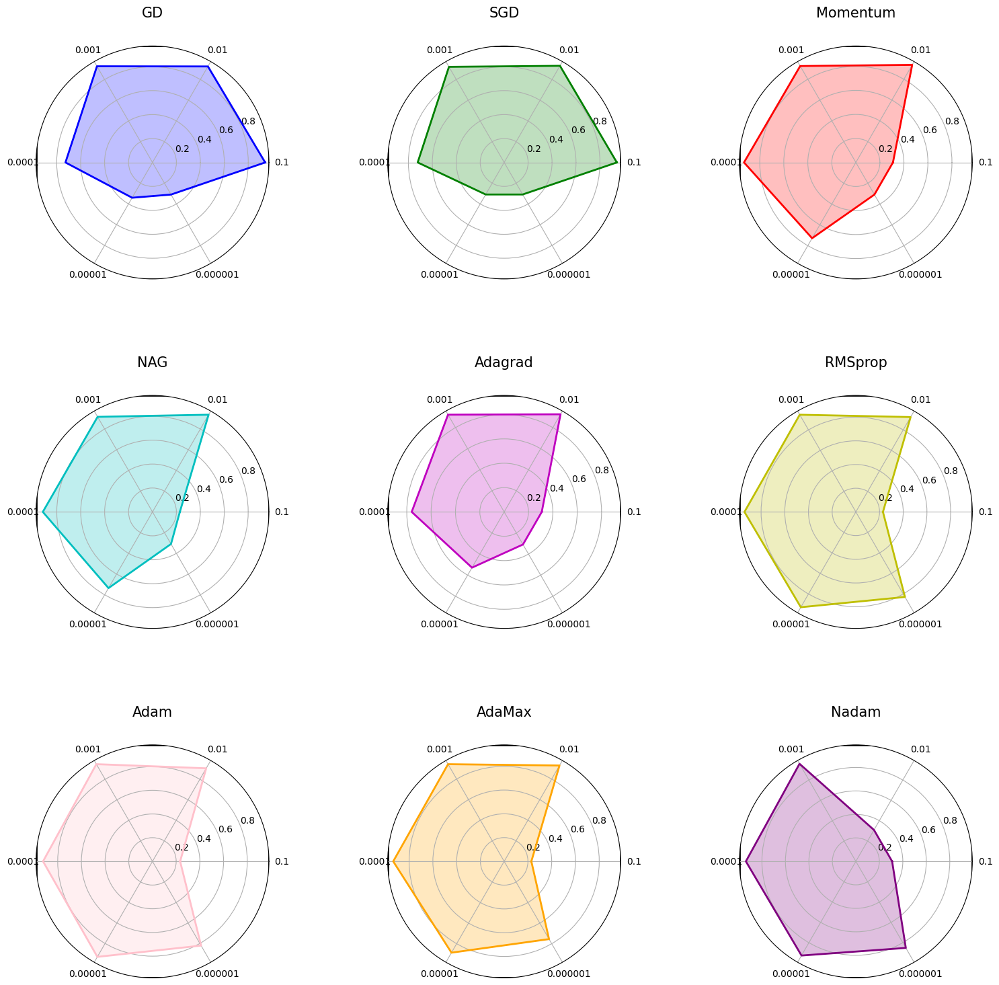

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from math import pi

# Define the data for the radar chart
labels = ['0.1', '0.01', '0.001', '0.0001', '0.00001', '0.000001']
categories = ['GD', 'SGD', 'Momentum', 'NAG', 'Adagrad', 'RMSprop', 'Adam', 'AdaMax', 'Nadam']

# Accuracy values for each optimizer
data = [
    [0.941266, 0.926011, 0.927536, 0.726926, 0.340198, 0.309687],  # GD
    [0.941266, 0.932113, 0.922197, 0.722349, 0.308925, 0.308925],  # SGD
    [0.308925, 0.938215, 0.926773, 0.93135, 0.728452, 0.308925],   # Momentum
    [0.228833, 0.938215, 0.91762, 0.916857, 0.735317, 0.309687],   # NAG
    [0.308925, 0.926011, 0.922197, 0.759725, 0.528604, 0.308925],  # Adagrad
    [0.228833, 0.924485, 0.947368, 0.940503, 0.929062, 0.829138],  # RMSprop
    [0.23341, 0.906941, 0.947368, 0.923722, 0.930587, 0.820748],   # Adam
    [0.228833, 0.93135, 0.944317, 0.933638, 0.887109, 0.755149],   # AdaMax
    [0.308925, 0.308925, 0.959573, 0.93669, 0.926011, 0.851259]    # Nadam
]

# Number of variables (learning rates)
num_vars = len(labels)

# Compute angle for each label on the radar chart
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += angles[:1]  # Complete the loop by connecting the last point to the first

# Define colors for each optimizer (fixed missing color for Adam)
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'pink', 'orange', 'purple']

# Create 3x3 subplots for the 9 optimizers with grid
fig, axs = plt.subplots(3, 3, figsize=(18, 18), subplot_kw=dict(polar=True))

# Flatten the axes array for easier iteration
axs = axs.flatten()

# Loop through each optimizer's data and plot on a separate subplot with unique color
for i, category_data in enumerate(data):
    ax = axs[i]
    values = category_data + category_data[:1]  # Repeat the first value to close the loop
    ax.plot(angles, values, linewidth=2, linestyle='solid', color=colors[i], label=categories[i])
    ax.fill(angles, values, color=colors[i], alpha=0.25)

    # Set gridlines
    ax.grid(True)

    # Set the category labels on the plot
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)

    # Set the title for each subplot
    ax.set_title(f'{categories[i]}', size=15, color='black', y=1.1)

    # Add a rectangle (border) around each subplot
    rect = Rectangle((0, 0), 1, 1, transform=ax.transAxes, color='black', fill=False, lw=2)
    ax.add_patch(rect)

# Adjust the space between subplots for better visual separation (borderlines)
plt.subplots_adjust(wspace=0.5, hspace=0.5)

# Display the plots
plt.show()


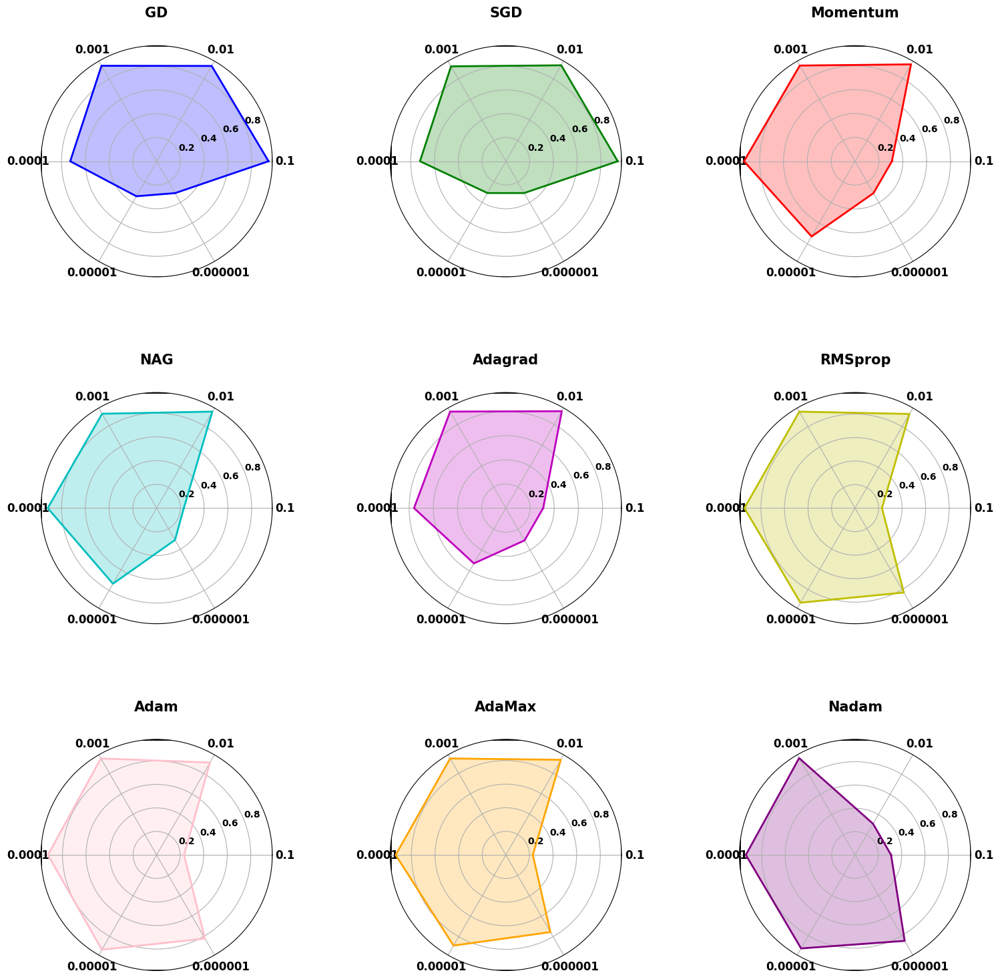

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from math import pi

# Define the data for the radar chart
labels = ['0.1', '0.01', '0.001', '0.0001', '0.00001', '0.000001']
categories = ['GD', 'SGD', 'Momentum', 'NAG', 'Adagrad', 'RMSprop', 'Adam', 'AdaMax', 'Nadam']

# Accuracy values for each optimizer
data = [
    [0.941266, 0.926011, 0.927536, 0.726926, 0.340198, 0.309687],  # GD
    [0.941266, 0.932113, 0.922197, 0.722349, 0.308925, 0.308925],  # SGD
    [0.308925, 0.938215, 0.926773, 0.93135, 0.728452, 0.308925],   # Momentum
    [0.228833, 0.938215, 0.91762, 0.916857, 0.735317, 0.309687],   # NAG
    [0.308925, 0.926011, 0.922197, 0.759725, 0.528604, 0.308925],  # Adagrad
    [0.228833, 0.924485, 0.947368, 0.940503, 0.929062, 0.829138],  # RMSprop
    [0.23341, 0.906941, 0.947368, 0.923722, 0.930587, 0.820748],   # Adam
    [0.228833, 0.93135, 0.944317, 0.933638, 0.887109, 0.755149],   # AdaMax
    [0.308925, 0.308925, 0.959573, 0.93669, 0.926011, 0.851259]    # Nadam
]

# Number of variables (learning rates)
num_vars = len(labels)

# Compute angle for each label on the radar chart
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += angles[:1]  # Complete the loop by connecting the last point to the first

# Define colors for each optimizer
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'pink', 'orange', 'purple']

# Create 3x3 subplots for the 9 optimizers with grid
fig, axs = plt.subplots(3, 3, figsize=(18, 18), subplot_kw=dict(polar=True))

# Flatten the axes array for easier iteration
axs = axs.flatten()

# Loop through each optimizer's data and plot on a separate subplot with unique color
for i, category_data in enumerate(data):
    ax = axs[i]
    values = category_data + category_data[:1]  # Repeat the first value to close the loop
    ax.plot(angles, values, linewidth=2, linestyle='solid', color=colors[i], label=categories[i])
    ax.fill(angles, values, color=colors[i], alpha=0.25)

    # Set gridlines
    ax.grid(True)

    # Set the category labels on the plot
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels, fontsize=12, fontweight='bold')  # Bold font for labels

    # Set the title for each subplot
    ax.set_title(f'{categories[i]}', size=15, color='black', y=1.1, fontweight='bold')  # Bold title

    # Add a rectangle (border) around each subplot
    rect = Rectangle((0, 0), 1, 1, transform=ax.transAxes, color='black', fill=False, lw=2)
    ax.add_patch(rect)

# Adjust the space between subplots for better visual separation
plt.subplots_adjust(wspace=0.5, hspace=0.5)

# Display the plots
plt.show()


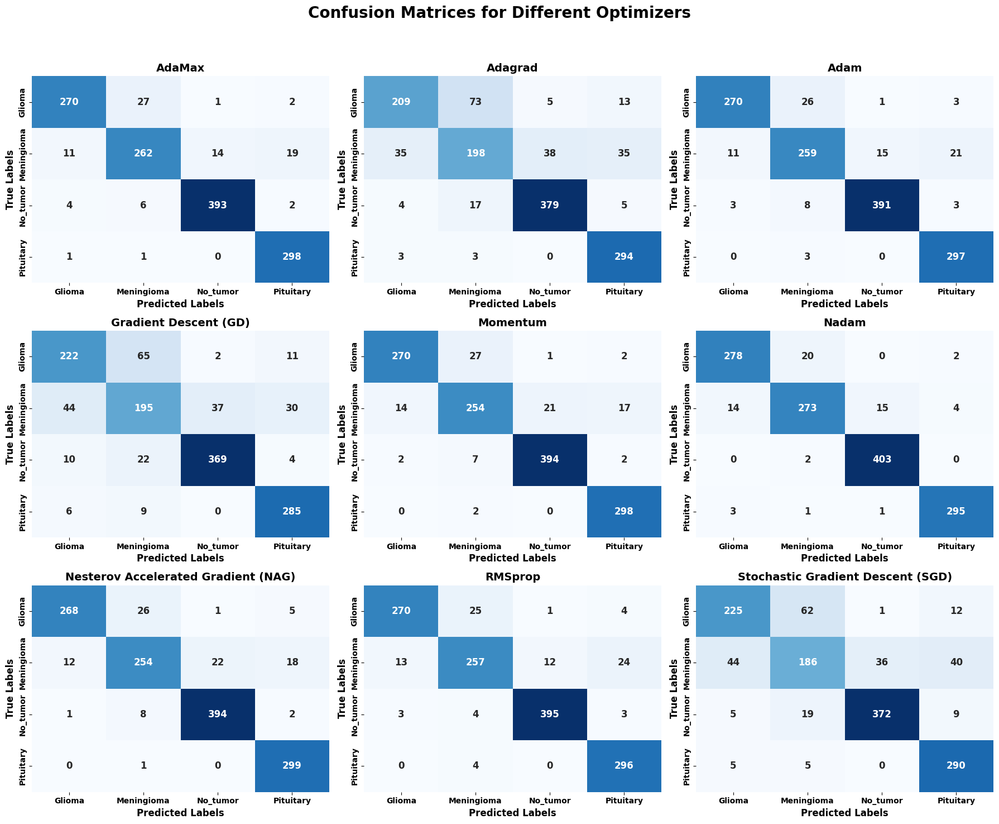

([[300, 306, 405, 300],
  [300, 306, 405, 300],
  [300, 306, 405, 300],
  [300, 306, 405, 300],
  [300, 306, 405, 300],
  [300, 306, 405, 300],
  [300, 306, 405, 300],
  [300, 306, 405, 300],
  [300, 306, 405, 300]],
 [1311, 1311, 1311, 1311, 1311, 1311, 1311, 1311, 1311])

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams

# Set global font weight for bold text
rcParams['font.weight'] = 'bold'

# Labels and Optimizer Names
labels = ['Glioma', 'Meningioma', 'No_tumor', 'Pituitary']
optimizer_Name = [
    "AdaMax", "Adagrad", "Adam", "Gradient Descent (GD)", "Momentum",
    "Nadam", "Nesterov Accelerated Gradient (NAG)", "RMSprop",
    "Stochastic Gradient Descent (SGD)"
]

# Confusion Matrices
cfs = [
    [[270, 27, 1, 2], [11, 262, 14, 19], [4, 6, 393, 2], [1, 1, 0, 298]],
    [[209, 73, 5, 13], [35, 198, 38, 35], [4, 17, 379, 5], [3, 3, 0, 294]],
    [[270, 26, 1, 3], [11, 259, 15, 21], [3, 8, 391, 3], [0, 3, 0, 297]],
    [[222, 65, 2, 11], [44, 195, 37, 30], [10, 22, 369, 4], [6, 9, 0, 285]],
    [[270, 27, 1, 2], [14, 254, 21, 17], [2, 7, 394, 2], [0, 2, 0, 298]],
    [[278, 20, 0, 2], [14, 273, 15, 4], [0, 2, 403, 0], [3, 1, 1, 295]],
    [[268, 26, 1, 5], [12, 254, 22, 18], [1, 8, 394, 2], [0, 1, 0, 299]],
    [[270, 25, 1, 4], [13, 257, 12, 24], [3, 4, 395, 3], [0, 4, 0, 296]],
    [[225, 62, 1, 12], [44, 186, 36, 40], [5, 19, 372, 9], [5, 5, 0, 290]]
]

# Plot 3x3 grid of confusion matrices
fig, axes = plt.subplots(3, 3, figsize=(18, 15))
fig.suptitle("Confusion Matrices for Different Optimizers", fontsize=20, fontweight='bold')

for i, ax in enumerate(axes.flat):
    sns.heatmap(
        cfs[i], annot=True, fmt='d', cmap='Blues', cbar=False,
        xticklabels=labels, yticklabels=labels, ax=ax, annot_kws={"size": 12, "fontweight": "bold"}
    )
    ax.set_title(optimizer_Name[i], fontsize=14, fontweight='bold')
    ax.set_xlabel("Predicted Labels", fontsize=12, fontweight='bold')
    ax.set_ylabel("True Labels", fontsize=12, fontweight='bold')
    ax.tick_params(axis='x', labelsize=10, labelrotation=0)
    ax.tick_params(axis='y', labelsize=10, labelrotation=90)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()
# Compute row sums and total sums for cfs
row_sums_cfs = [[sum(row) for row in matrix] for matrix in cfs]
total_sums_cfs = [sum(rows) for rows in row_sums_cfs]
row_sums_cfs, total_sums_cfs

In [ ]:
pip install visualkeras

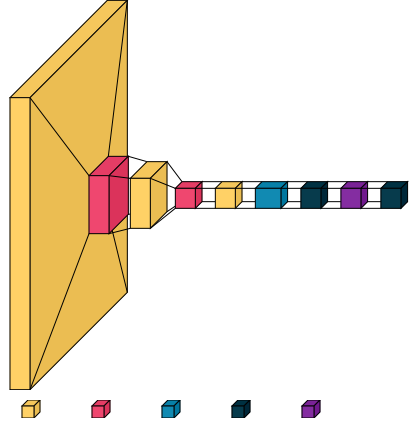

In [ ]:
import visualkeras
from tensorflow.keras import layers, models
from PIL import ImageFont

# Define the model architecture
model = models.Sequential([
    layers.Conv2D(16, (5, 5), activation="relu", input_shape=(150, 150, 3)),
    layers.MaxPooling2D(pool_size=(5, 5)),
    layers.Conv2D(32, (5, 5), activation="relu"),
    layers.MaxPooling2D(pool_size=(4, 4)),
    layers.Conv2D(16, (3, 3), activation="relu"),
    layers.Flatten(),
    layers.Dense(8, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(4, activation="softmax")  # Assuming 4 output classes
])

# Adjust font size and resolution for better visibility
try:
    font = ImageFont.truetype("arial.ttf", 18)  # Adjust font size
except IOError:
    font = ImageFont.load_default()  # Use default font if Arial is not available

# Generate the layered view
visualkeras.layered_view(
    model,
    legend=True,
    font=font,
    spacing=25,  # Adjust spacing between layers for clarity
    scale_xy=2  # Use a single integer for scaling
)



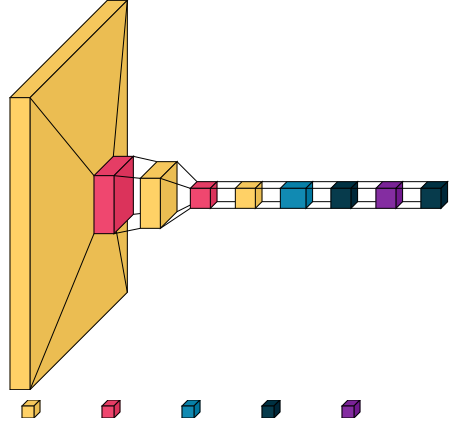

In [ ]:
import visualkeras
from tensorflow.keras import layers, models
from PIL import ImageFont

# Define the model architecture
model = models.Sequential([
    layers.Conv2D(16, (5, 5), activation="relu", input_shape=(150, 150, 3)),
    layers.MaxPooling2D(pool_size=(5, 5)),
    layers.Conv2D(32, (5, 5), activation="relu"),
    layers.MaxPooling2D(pool_size=(4, 4)),
    layers.Conv2D(16, (3, 3), activation="relu"),
    layers.Flatten(),
    layers.Dense(8, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(4, activation="softmax")  # Assuming 4 output classes
])

# Use default font for text
font = ImageFont.load_default()

# Generate the layered view
visualkeras.layered_view(
    model,
    legend=True,
    font=font,
    spacing=25,  # Adjusted spacing for better readability
    scale_xy=2   # Scaling for better layer size and visibility
)



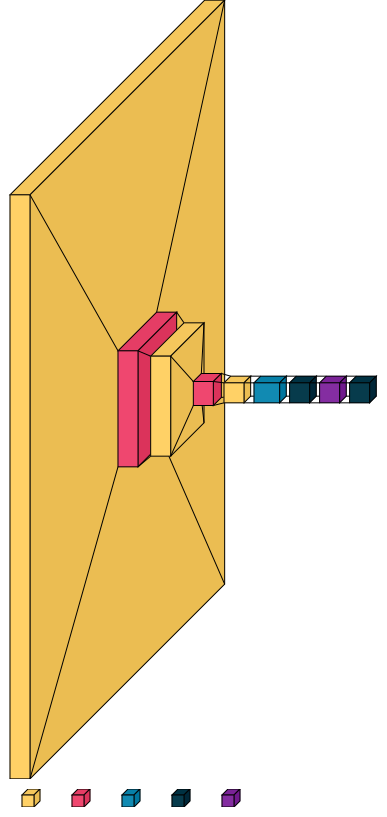

In [ ]:
visualkeras.layered_view(model, legend=True) # without custom font
from PIL import ImageFont
visualkeras.layered_view(model, legend=True)

In [ ]:
# Create a new document with an expanded table
from docx import Document
doc = Document()

# Add title and table heading
doc.add_heading('AI-Powered Research Assistant Tools: Revolutionizing Cutting-Edge and Innovative Article Writing', level=1)

# Create a table with additional rows and columns
table = doc.add_table(rows=1, cols=9)

# Add the table header
hdr_cells = table.rows[0].cells
hdr_cells[0].text = 'Category'
hdr_cells[1].text = 'Tool Name'
hdr_cells[2].text = 'User Rating (1-5)'
hdr_cells[3].text = 'Number of Users'
hdr_cells[4].text = 'Pricing (Monthly)'
hdr_cells[5].text = 'Features Count'
hdr_cells[6].text = 'Platform Availability'
hdr_cells[7].text = 'Performance Metrics'
hdr_cells[8].text = 'Integrations'
hdr_cells[9].text = 'Year Established'

# Expanded data to fill in
expanded_tools_data = [
    ("Reference Management", "Zotero", 4.5, "2 million", "Free", 15, "Web, iOS, Android", "N/A", "100+", 2006),
    ("Reference Management", "Mendeley", 4.4, "1.5 million", "Free/Paid", 12, "Web, iOS, Android", "N/A", "50+", 2008),
    ("Writing and Editing", "Grammarly", 4.7, "30 million", "$12.00", 20, "Web, iOS, Android", "95% accuracy", "30+", 2009),
    ("Writing and Editing", "Writefull", 4.3, "200,000", "Free/Paid", 10, "Web", "90% accuracy", "15+", 2017),
    ("AI Writing", "ChatGPT", 4.6, "10 million", "Free/Paid", 8, "Web, iOS, Android", "Response in <1 sec", "20+", 2020),
    ("Plagiarism", "Turnitin", 4.2, "4 million", "$15.00", 5, "Web", "99% accuracy", "10+", 1998),
    ("Visualization", "Tableau", 4.5, "1 million", "$70.00", 25, "Web, Desktop", "N/A", "150+", 2003),
    ("Writing and Editing", "ProWritingAid", 4.5, "1 million", "$20.00", 25, "Web, iOS, Android", "85% accuracy", "20+", 2012),
    ("Writing and Editing", "Hemingway Editor", 4.4, "500,000", "$19.99", 10, "Web, Desktop", "N/A", "5+", 2013),
    ("Collaboration", "Google Docs", 4.8, "Over 1 billion", "Free", 15, "Web, iOS, Android", "N/A", "100+", 2006),
    ("Data Analysis", "RStudio", 4.6, "500,000", "Free", 20, "Desktop", "N/A", "50+", 2011),
    ("Data Visualization", "Infogram", 4.5, "100,000", "$19.00", 10, "Web", "N/A", "30+", 2012),
    ("AI Writing", "Jasper", 4.2, "300,000", "$29.00", 10, "Web", "N/A", "20+", 2021),
    ("Collaboration", "Slack", 4.5, "20 million", "Free/Paid", 15, "Web, iOS, Android", "N/A", "50+", 2013),
    ("Project Management", "Trello", 4.4, "50 million", "Free/Paid", 10, "Web, iOS, Android", "N/A", "30+", 2011),
    ("Plagiarism", "Grammarly (Premium)", 4.7, "30 million", "$12.00", 20, "Web, iOS, Android", "95% accuracy", "30+", 2009),
]

# Add data to the table
for category, tool, user_rating, number_of_users, pricing, features_count, platform_availability, performance_metrics, integrations, year_established in expanded_tools_data:
    row_cells = table.add_row().cells
    row_cells[0].text = category
    row_cells[1].text = tool
    row_cells[2].text = str(user_rating)
    row_cells[3].text = number_of_users
    row_cells[4].text = pricing
    row_cells[5].text = str(features_count)
    row_cells[6].text = platform_availability
    row_cells[7].text = performance_metrics
    row_cells[8].text = integrations
    row_cells[9].text = str(year_established)

# Save the document
doc_path_expanded = "/mnt/data/Expanded_AI_Research_Assistant_Tools_Table.docx"
doc.save(doc_path_expanded)

doc_path_expanded


ModuleNotFoundError: No module named 'docx'

In [ ]:
from docx import Document



# Create a new Document

doc = Document()

doc.add_heading('Metrics for AI Models in Medical Imaging', 0)



# Add introduction

doc.add_paragraph(

    "This document contains an expanded list of metrics with formulas "

    "for AI models in medical imaging across tasks like classification, detection, segmentation, "

    "and super-resolution."

)



# Classification Metrics

doc.add_heading('1. Classification Metrics', level=1)

doc.add_paragraph("These metrics assess models that predict a label for an entire image.")

classification_table = doc.add_table(rows=1, cols=3)

classification_table.style = 'Table Grid'

hdr_cells = classification_table.rows[0].cells

hdr_cells[0].text = "Metric"

hdr_cells[1].text = "Formula"

hdr_cells[2].text = "Description"



classification_metrics = [

    ("Accuracy", "Accuracy = (TP + TN) / (TP + TN + FP + FN)", "Proportion of correct predictions."),

    ("Precision", "Precision = TP / (TP + FP)", "Proportion of positive predictions that are correct."),

    ("Recall (Sensitivity)", "Recall = TP / (TP + FN)", "Proportion of true positives correctly identified."),

    ("Specificity", "Specificity = TN / (TN + FP)", "Proportion of true negatives correctly identified."),

    ("F1 Score", "F1 = 2 * (Precision * Recall) / (Precision + Recall)", "Harmonic mean of precision and recall."),

    ("AUC-ROC", "No formula (area under curve of TPR vs FPR)", "Measures model’s ability to distinguish classes."),

    ("AUC-PR", "No formula (area under precision-recall curve)", "Useful for imbalanced datasets."),

    ("Cohen's Kappa", "κ = (p_o - p_e) / (1 - p_e)", "Adjusts accuracy for chance agreement.")

]



for metric, formula, description in classification_metrics:

    row_cells = classification_table.add_row().cells

    row_cells[0].text = metric

    row_cells[1].text = formula

    row_cells[2].text = description



# Detection Metrics

doc.add_heading('2. Detection Metrics', level=1)

doc.add_paragraph("These metrics evaluate object detection models that predict bounding boxes and classes.")

detection_table = doc.add_table(rows=1, cols=3)

detection_table.style = 'Table Grid'

hdr_cells = detection_table.rows[0].cells

hdr_cells[0].text = "Metric"

hdr_cells[1].text = "Formula"

hdr_cells[2].text = "Description"



detection_metrics = [

    ("Precision", "Precision = TP / (TP + FP)", "Proportion of correctly predicted bounding boxes."),

    ("Recall", "Recall = TP / (TP + FN)", "Proportion of true positive bounding boxes detected."),

    ("IoU (Intersection over Union)", "IoU = Area of Overlap / Area of Union", "Measures overlap between predicted and true bounding boxes."),

    ("mAP (mean Average Precision)", "mAP = 1/N ∑ AP_i", "Average precision across multiple classes."),

    ("F1 Score", "F1 = 2 * (Precision * Recall) / (Precision + Recall)", "Combines precision and recall."),

    ("TPR", "TPR = TP / (TP + FN)", "Proportion of true positives correctly detected."),

    ("FNR", "FNR = FN / (FN + TP)", "Proportion of actual positives missed.")

]



for metric, formula, description in detection_metrics:

    row_cells = detection_table.add_row().cells

    row_cells[0].text = metric

    row_cells[1].text = formula

    row_cells[2].text = description



# Segmentation Metrics

doc.add_heading('3. Segmentation Metrics', level=1)

doc.add_paragraph("These metrics measure how well models segment an image at a pixel level.")

segmentation_table = doc.add_table(rows=1, cols=3)

segmentation_table.style = 'Table Grid'

hdr_cells = segmentation_table.rows[0].cells

hdr_cells[0].text = "Metric"

hdr_cells[1].text = "Formula"

hdr_cells[2].text = "Description"



segmentation_metrics = [

    ("Dice Coefficient", "Dice = 2 * (|A ∩ B|) / (|A| + |B|)", "Measures overlap between predicted and ground truth masks."),

    ("Jaccard Index (IoU)", "IoU =

SyntaxError: unterminated string literal (detected at line 157) (<ipython-input-1-5e20983d5112>, line 157)

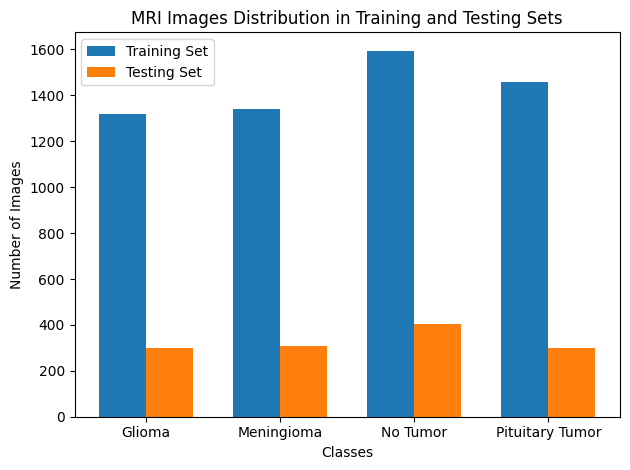

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data
classes = ['Glioma', 'Meningioma', 'No Tumor', 'Pituitary Tumor']
train_counts = [1321, 1339, 1595, 1457]  # Training set
test_counts = [300, 306, 405, 300]        # Testing set

# Bar width
bar_width = 0.35

# X locations for the groups
x = np.arange(len(classes))

# Create bars
bars1 = plt.bar(x - bar_width/2, train_counts, bar_width, label='Training Set')
bars2 = plt.bar(x + bar_width/2, test_counts, bar_width, label='Testing Set')

# Adding labels and title
plt.xlabel('Classes')
plt.ylabel('Number of Images')
plt.title('MRI Images Distribution in Training and Testing Sets')
plt.xticks(x, classes)
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()



In [ ]:
# Create stacked pie chart data
train_counts = [1321, 1339, 1595, 1457]  # Training set
test_counts = [300, 306, 405, 300]        # Testing set

# Combine training and testing counts for stacked pie chart
combined_counts = np.array(train_counts) + np.array(test_counts)

# Create the pie chart
plt.figure(figsize=(8, 8))

# Define colors
colors = ['#66c2a5', '#fc8d62', '#8da0cb', '#e78ac3']

# Create a stacked pie chart
plt.pie(train_counts, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors, radius=0.7)
plt.pie(test_counts, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors, radius=1.0)

# Adding title
plt.title('Stacked Pie Chart of MRI Images Distribution')
plt.legend(labels, loc='upper right')

# Display the pie chart
plt.show()


NameError: name 'labels' is not defined

<Figure size 800x800 with 0 Axes>

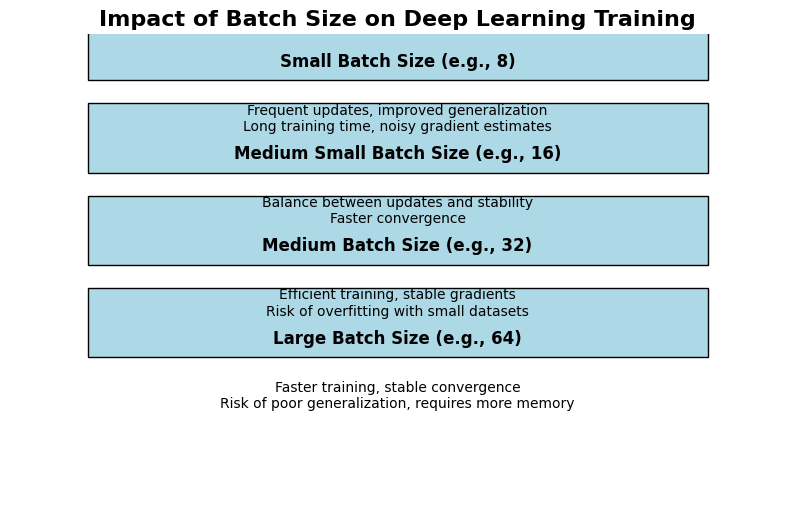

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Define the sections of the diagram
sections = [
    ("Small Batch Size (e.g., 8)", "Frequent updates, improved generalization\nLong training time, noisy gradient estimates"),
    ("Medium Small Batch Size (e.g., 16)", "Balance between updates and stability\nFaster convergence"),
    ("Medium Batch Size (e.g., 32)", "Efficient training, stable gradients\nRisk of overfitting with small datasets"),
    ("Large Batch Size (e.g., 64)", "Faster training, stable convergence\nRisk of poor generalization, requires more memory")
]

# Add sections to the diagram
for i, (title, text) in enumerate(sections):
    rect = mpatches.Rectangle((0.1, 0.9 - i * 0.2), 0.8, 0.15, ec='black', fc='lightblue')
    ax.add_patch(rect)
    ax.text(0.5, 0.93 - i * 0.2, title, ha='center', fontsize=12, weight='bold')
    ax.text(0.5, 0.85 - i * 0.2, text, ha='center', fontsize=10, va='top', wrap=True)

# Set limits and hide axes
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.axis('off')

# Title
plt.title('Impact of Batch Size on Deep Learning Training', fontsize=16, weight='bold')

# Display the diagram
plt.show()
